# Nasal CT Real Final Notebook: ConvNeXt-Tiny and Swin-T 5-Fold Evaluation

This final notebook runs only the final selected models:

1. **ConvNeXt-Tiny + focal loss gamma=1 + LR=1e-4 + strict early stopping**
2. **Swin-T + focal loss gamma=1 + differential LR + strict early stopping**

The Excel `normal` column is ignored. Only the five abnormality labels are used. Confusion matrices are **5×5 only** and never include a extra normal category.


## 1. Install dependencies

In [1]:
# Kaggle usually already includes torch, torchvision, sklearn, pandas, numpy, matplotlib.
# MONAI and pynrrd are installed because the CT files are NRRD and SwinUNETR is from MONAI.
!pip -q install "monai>=1.3.0" pynrrd openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 29.7 MB/s eta 0:00:0000:0100:01


## 2. Imports, version check, and deterministic setup

In [2]:
import os
import re
import gc
import json
import time
import math
import glob
import random
import hashlib
import warnings
from pathlib import Path
from contextlib import nullcontext
from collections import defaultdict

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
os.environ["PYTHONWARNINGS"] = "ignore"
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from sklearn.metrics import (
    f1_score, precision_score, recall_score,
    average_precision_score, roc_auc_score,
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_curve, roc_curve,
)
from tqdm.auto import tqdm

import monai
from monai.data import Dataset as MonaiDataset
from monai.inferers import sliding_window_inference
from monai.networks.nets import SwinUNETR
from monai.transforms import (
    Compose, LoadImaged, EnsureChannelFirstd, Orientationd, Spacingd,
    ScaleIntensityRanged, CropForegroundd, SpatialPadd, EnsureTyped,
)
from monai.utils import set_determinism

import torchvision
from torchvision import models

try:
    from IPython.display import display
except Exception:
    pass

print("Python:", os.sys.version.split()[0])
print("PyTorch:", torch.__version__)
print("Torchvision:", torchvision.__version__)
print("MONAI:", monai.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    gpu_name = torch.cuda.get_device_name(0)
    gpu_cc = torch.cuda.get_device_capability(0)
    print("GPU:", gpu_name)
    print("CUDA capability:", gpu_cc)
    # Kaggle's newer PyTorch + CUDA 12.x builds can fail on old P100 in some environments.
    # This notebook is intended for T4/T4x2. Stop and switch accelerator if this triggers.
    if "P100" in gpu_name and "+cu128" in torch.__version__:
        raise RuntimeError(
            "This Kaggle environment uses PyTorch built with CUDA 12.8, but the selected GPU is Tesla P100 (sm_60). "
            "Please switch Kaggle Accelerator to T4 x2, restart, and run again."
        )

E0000 00:00:1778071375.292870      57 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1778071375.436198      57 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1778071376.379300      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778071376.379360      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778071376.379364      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778071376.379367      57 computation_placer.cc:177] computation placer already registered. Please check linka

Python: 3.12.12
PyTorch: 2.10.0+cu128
Torchvision: 0.25.0+cu128
MONAI: 1.5.2
CUDA available: True
GPU: Tesla T4
CUDA capability: (7, 5)


## 3. Configuration

In [3]:
CFG = {
    # ----------------------------
    # Kaggle/path handling
    # ----------------------------
    "dataset_root": None,
    "images_dir": None,
    "labels_dir": None,
    "label_xlsx": None,
    "seg_ckpt": None,
    "output_dir": "/kaggle/working/nasal_ct_real_final_convnext_swin_5fold",
    "roi_cache_dir": "/kaggle/working/nasal_ct_real_final_convnext_swin_5fold/roi_cache",

    # ----------------------------
    # Reproducibility
    # ----------------------------
    "seed": 42,
    "n_folds": 5,
    "fold_search_iters": 25000,

    # ----------------------------
    # Preprocessing
    # ----------------------------
    "target_spacing": (1.0, 1.0, 1.5),
    "hu_min": -400,
    "hu_max": 1000,

    # ----------------------------
    # SwinUNETR segmentation model settings
    # Must match your segmentation notebook checkpoint when using predicted masks.
    # ----------------------------
    "seg_num_classes": 6,
    "seg_in_channels": 1,
    "seg_feature_size": 48,
    "seg_norm_name": "instance",
    "seg_drop_rate": 0.0,
    "seg_attn_drop_rate": 0.0,
    "seg_dropout_path_rate": 0.0,
    "seg_use_checkpoint": True,
    "seg_roi_size": (96, 96, 32),
    "seg_sw_batch_size": 2,
    "seg_infer_overlap": 0.5,

    # Valid: "auto", "predicted", "ground_truth".
    # For classification comparison, ground-truth masks are fastest/stablest.
    "roi_source": "ground_truth",

    # ----------------------------
    # ROI extraction/classification
    # ----------------------------
    "roi_size": (96, 96, 96),
    "roi_channels": 2,  # CT crop + binary ROI mask crop
    "septum_lr_fraction": 0.35,
    "derived_septum_axis_pad": 6,
    "derived_septum_min_axis_width": 12,
    "derived_septum_tissue_threshold": 0.18,
    "derived_septum_min_mask_voxels": 100,
    "roi_cache_dtype": "float16",
    "roi_2d_size": 224,

    # ----------------------------
    # Training
    # ----------------------------
    "max_epochs": 20,
    "early_stop_patience": 3,
    "early_stop_min_delta": 0.005,
    "batch_size_3d": 4,
    "batch_size_2d": 4,
    "batch_size_swin_encoder": 1,
    "num_workers": 2,

    # User-requested LR = 1e-4. Most experiments use 1e-4 after unfreezing.
    # Some experiments explicitly override backbone_lr=1e-5 as a best-practice differential-LR test.
    "learning_rate_3d": 1e-4,
    "learning_rate_2d_head": 1e-4,
    "learning_rate_2d_backbone": 1e-4,
    "learning_rate_swin_head": 1e-4,
    "learning_rate_swin_encoder": 1e-5,
    "weight_decay": 1e-4,
    "use_amp": True,
    "grad_clip": 1.0,
    "scheduler_factor": 0.5,
    "scheduler_patience": 1,
    "min_lr": 1e-7,

    # Threshold tuning.
    # Primary reporting uses F1 thresholds. Balanced/Youden and high-recall are still reported.
    "threshold_grid": np.round(np.arange(0.05, 0.96, 0.01), 2).tolist(),
    "primary_threshold_strategy": "f1",
    "high_recall_target": 0.90,
    "monitor_metric": "macro_f1",  # used by ReduceLROnPlateau and early stopping

    # Loss/sampling imbalance controls
    "pos_weight_mode": "sqrt",   # "sqrt" or "raw"
    "pos_weight_max": 5.0,
    "sampler_weight_max": 8.0,

    # Light augmentation only for train split.
    "ct_aug_noise_std": 0.012,
    "ct_aug_scale_range": (0.97, 1.03),
    "ct_aug_shift_range": (-0.025, 0.025),
    "coarse_dropout_prob": 0.15,
    "coarse_dropout_max_fraction": 0.12,

    # Transfer learning controls
    "freeze_backbone_epochs": 2,
    "freeze_swin_encoder": True,

    # Post-hoc OOF ensembling.
    "run_posthoc_ensembles": False,

    # Optional 10-fold follow-up. Leave False for the main autonomous run.
    "run_10fold_best_family_after_5fold": False,
    "n_folds_optional": 10,

    # Runtime controls
    "skip_finished_folds": True,
    "quick_debug": False,  # True = 1 fold, 1 epoch, 2 experiments for smoke test.
}

Path(CFG["output_dir"]).mkdir(parents=True, exist_ok=True)
Path(CFG["roi_cache_dir"]).mkdir(parents=True, exist_ok=True)
CFG["device"] = torch.device("cuda" if torch.cuda.is_available() else "cpu")

set_determinism(seed=CFG["seed"])
random.seed(CFG["seed"])
np.random.seed(CFG["seed"])
torch.manual_seed(CFG["seed"])
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(CFG["seed"])
    torch.backends.cudnn.benchmark = True

print("Output directory:", CFG["output_dir"])
print("Device:", CFG["device"])

Output directory: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold
Device: cuda


## 4. Find Kaggle input paths automatically

In [4]:
def find_candidates():
    image_dirs = sorted({str(Path(p).parent) for p in glob.glob("/kaggle/input/**/*.nrrd", recursive=True) if Path(p).parent.name.lower() == "images"})
    label_dirs = sorted({str(Path(p).parent) for p in glob.glob("/kaggle/input/**/*.nrrd", recursive=True) if Path(p).parent.name.lower() == "labels"})
    xlsx_files = sorted(glob.glob("/kaggle/input/**/*.xlsx", recursive=True))
    ckpt_files = sorted(glob.glob("/kaggle/input/**/*.pth", recursive=True))
    return image_dirs, label_dirs, xlsx_files, ckpt_files

image_dirs, label_dirs, xlsx_files, ckpt_files = find_candidates()

print("Candidate image directories:")
for p in image_dirs: print("  ", p)
print("\nCandidate label directories:")
for p in label_dirs: print("  ", p)
print("\nCandidate Excel workbooks:")
for p in xlsx_files: print("  ", p)
print("\nCandidate .pth checkpoints:")
for p in ckpt_files: print("  ", p)

# Conservative auto-selection.
if len(image_dirs) == 1:
    CFG["images_dir"] = image_dirs[0]
    CFG["dataset_root"] = str(Path(CFG["images_dir"]).parent)
if len(label_dirs) == 1:
    CFG["labels_dir"] = label_dirs[0]

preferred_xlsx = [p for p in xlsx_files if "model_ready" in Path(p).name.lower() or "labels" in Path(p).name.lower()]
if len(preferred_xlsx) == 1:
    CFG["label_xlsx"] = preferred_xlsx[0]
elif len(xlsx_files) == 1:
    CFG["label_xlsx"] = xlsx_files[0]

preferred_ckpts = [p for p in ckpt_files if Path(p).name == "best_model.pth"]
if len(preferred_ckpts) == 1:
    CFG["seg_ckpt"] = preferred_ckpts[0]
elif len(ckpt_files) == 1:
    CFG["seg_ckpt"] = ckpt_files[0]

print("\nAuto-selected paths:")
for k in ["dataset_root", "images_dir", "labels_dir", "label_xlsx", "seg_ckpt"]:
    print(f"{k:14s}: {CFG[k]}")

Candidate image directories:
   /kaggle/input/datasets/alaazaiter/nasalseg/NasalSeg/images

Candidate label directories:
   /kaggle/input/datasets/alaazaiter/nasalseg/NasalSeg/labels

Candidate Excel workbooks:
   /kaggle/input/datasets/alaazaiter/label-xlsx/CT-AI_model_ready_labels.xlsx

Candidate .pth checkpoints:
   /kaggle/input/notebooks/alaazaiter/nasalsegswinunetr/runs/swinunetr_nasalseg_run1/best_model.pth
   /kaggle/input/notebooks/alaazaiter/nasalsegswinunetr/runs/swinunetr_nasalseg_run1/last_model.pth

Auto-selected paths:
dataset_root  : /kaggle/input/datasets/alaazaiter/nasalseg/NasalSeg
images_dir    : /kaggle/input/datasets/alaazaiter/nasalseg/NasalSeg/images
labels_dir    : /kaggle/input/datasets/alaazaiter/nasalseg/NasalSeg/labels
label_xlsx    : /kaggle/input/datasets/alaazaiter/label-xlsx/CT-AI_model_ready_labels.xlsx
seg_ckpt      : /kaggle/input/notebooks/alaazaiter/nasalsegswinunetr/runs/swinunetr_nasalseg_run1/best_model.pth


## 5. Manual path override if auto-selection was wrong

In [5]:
# Edit these only if the previous cell selected the wrong path or left something as None.
# Examples:
# CFG["images_dir"] = "/kaggle/input/nasalseg/NasalSeg/images"
# CFG["labels_dir"] = "/kaggle/input/nasalseg/NasalSeg/labels"
# CFG["label_xlsx"] = "/kaggle/input/ct-ai-model-ready-labels/CT-AI_model_ready_labels.xlsx"
# CFG["seg_ckpt"] = "/kaggle/input/bestmodel1/runs/swinunetr_nasalseg_run1/best_model.pth"

required = ["images_dir", "labels_dir", "label_xlsx"]
for key in required:
    assert CFG[key] is not None, f"CFG['{key}'] is None. Set it manually in this cell."
    assert os.path.exists(CFG[key]), f"Path does not exist: CFG['{key}'] = {CFG[key]}"

if CFG["seg_ckpt"] is not None and not os.path.exists(CFG["seg_ckpt"]):
    print("Ignoring non-existing seg_ckpt:", CFG["seg_ckpt"])
    CFG["seg_ckpt"] = None

if CFG["roi_source"] == "auto":
    CFG["effective_roi_source"] = "predicted" if CFG["seg_ckpt"] else "ground_truth"
else:
    CFG["effective_roi_source"] = CFG["roi_source"]

if CFG["effective_roi_source"] == "predicted" and not CFG["seg_ckpt"]:
    raise ValueError("roi_source='predicted' requires CFG['seg_ckpt']. Use 'auto' or 'ground_truth' otherwise.")

print("All required paths exist.")
print("Effective ROI source:", CFG["effective_roi_source"])
print(json.dumps({k: str(CFG[k]) for k in ["images_dir", "labels_dir", "label_xlsx", "seg_ckpt", "effective_roi_source"]}, indent=2))

All required paths exist.
Effective ROI source: ground_truth
{
  "images_dir": "/kaggle/input/datasets/alaazaiter/nasalseg/NasalSeg/images",
  "labels_dir": "/kaggle/input/datasets/alaazaiter/nasalseg/NasalSeg/labels",
  "label_xlsx": "/kaggle/input/datasets/alaazaiter/label-xlsx/CT-AI_model_ready_labels.xlsx",
  "seg_ckpt": "/kaggle/input/notebooks/alaazaiter/nasalsegswinunetr/runs/swinunetr_nasalseg_run1/best_model.pth",
  "effective_roi_source": "ground_truth"
}


## 6. Target labels and ROI definitions

In [6]:
SEG_CLASS_NAMES = {
    0: "Background",
    1: "Right Maxillary Sinus",
    2: "Left Maxillary Sinus",
    3: "Right Nasal Cavity",
    4: "Left Nasal Cavity",
    5: "Nasopharynx",
}

# Final labels: use only the five abnormality labels. Ignore any "normal" column in the Excel file.
TARGET_COLS = [
    "nasal_septum_abnormal",
    "right_maxillary_abnormal",
    "left_maxillary_abnormal",
    "right_inferior_turbinate_hypertrophy",
    "left_inferior_turbinate_hypertrophy",
]

DISPLAY_LABEL_NAMES = {
    "nasal_septum_abnormal": "nasal_septum_abnormal",
    "right_maxillary_abnormal": "right_maxillary_abnormal",
    "left_maxillary_abnormal": "left_maxillary_abnormal",
    "right_inferior_turbinate_hypertrophy": "right_inferior_turbinate_abnormal",
    "left_inferior_turbinate_hypertrophy": "left_inferior_turbinate_abnormal",
}

def display_label(label):
    return DISPLAY_LABEL_NAMES.get(str(label), str(label))

def display_label_multiline(label):
    return display_label(label).replace("_", "\n")

# Final stable contextual ROIs. We do not use the brittle pure septum/turbinate pseudo-ROIs.
ROI_SPECS = [
    {"name": "right_maxillary_roi", "seg_labels": [1], "pad": (8, 8, 4), "targets": ["right_maxillary_abnormal"], "kind": "standard"},
    {"name": "left_maxillary_roi", "seg_labels": [2], "pad": (8, 8, 4), "targets": ["left_maxillary_abnormal"], "kind": "standard"},
    {"name": "nasal_septum_region_roi", "seg_labels": [3, 4], "pad": (18, 18, 6), "targets": ["nasal_septum_abnormal"], "kind": "tight_septum_neighbors"},
    {"name": "right_nasal_cavity_roi", "seg_labels": [3], "pad": (10, 10, 5), "targets": ["right_inferior_turbinate_hypertrophy"], "kind": "standard"},
    {"name": "left_nasal_cavity_roi", "seg_labels": [4], "pad": (10, 10, 5), "targets": ["left_inferior_turbinate_hypertrophy"], "kind": "standard"},
]
ROI_NAMES = [r["name"] for r in ROI_SPECS]

LABEL_TO_ROI_BASELINE = {
    "right_maxillary_abnormal": ROI_NAMES.index("right_maxillary_roi"),
    "left_maxillary_abnormal": ROI_NAMES.index("left_maxillary_roi"),
    "nasal_septum_abnormal": ROI_NAMES.index("nasal_septum_region_roi"),
    "right_inferior_turbinate_hypertrophy": ROI_NAMES.index("right_nasal_cavity_roi"),
    "left_inferior_turbinate_hypertrophy": ROI_NAMES.index("left_nasal_cavity_roi"),
}
LABEL_TO_ROI = LABEL_TO_ROI_BASELINE

def label_to_roi_for_experiment(exp=None):
    return dict(LABEL_TO_ROI_BASELINE)

assert set(TARGET_COLS) == set(LABEL_TO_ROI_BASELINE), "Every target must map to exactly one ROI."
print("Final labels and stable ROIs:")
for t in TARGET_COLS:
    print(f"{t:45s} -> {display_label(t):38s} -> {ROI_NAMES[LABEL_TO_ROI_BASELINE[t]]}")
print("\nImportant: any Excel column named normal / Normal is ignored and is not used as a target.")


Final labels and stable ROIs:
nasal_septum_abnormal                         -> nasal_septum_abnormal                  -> nasal_septum_region_roi
right_maxillary_abnormal                      -> right_maxillary_abnormal               -> right_maxillary_roi
left_maxillary_abnormal                       -> left_maxillary_abnormal                -> left_maxillary_roi
right_inferior_turbinate_hypertrophy          -> right_inferior_turbinate_abnormal      -> right_nasal_cavity_roi
left_inferior_turbinate_hypertrophy           -> left_inferior_turbinate_abnormal       -> left_nasal_cavity_roi

Important: any Excel column named normal / Normal is ignored and is not used as a target.


## 7. Load label workbook and match cases

In [7]:
def normalize_case_id(x):
    x = str(x).strip()
    x = Path(x).stem
    for suffix in ["_img", "_image", "_label", "_mask", "_seg", "_segmentation"]:
        if x.lower().endswith(suffix):
            x = x[: -len(suffix)]
    return x

def candidate_case_ids_from_path(path):
    stem = normalize_case_id(Path(path).stem)
    candidates = [stem]
    if "_" in stem:
        candidates.append(stem.split("_")[0])
    if "-" in stem:
        candidates.append(stem.split("-")[0])
    out = []
    for c in candidates:
        if c not in out:
            out.append(c)
    return out

def make_file_map(files):
    mp = {}
    collisions = defaultdict(list)
    for p in files:
        for cid in candidate_case_ids_from_path(p):
            if cid not in mp:
                mp[cid] = p
            else:
                collisions[cid].append(p)
    if collisions:
        print("Warning: filename ID collisions detected. First path kept for these IDs:", list(collisions)[:10])
    return mp

def load_label_workbook(path):
    xls = pd.ExcelFile(path)
    chosen = None
    for sheet in xls.sheet_names:
        df = pd.read_excel(path, sheet_name=sheet)
        if "Case" in df.columns and all(c in df.columns for c in TARGET_COLS):
            chosen = (sheet, df)
            break
    if chosen is None:
        # Fallback: choose first sheet containing Case, then error clearly if target columns are missing.
        for sheet in xls.sheet_names:
            df = pd.read_excel(path, sheet_name=sheet)
            if "Case" in df.columns:
                chosen = (sheet, df)
                break
    if chosen is None:
        raise ValueError(f"No sheet with a 'Case' column was found in {path}")
    sheet, df = chosen
    print("Using workbook sheet:", sheet)
    return df

label_df = load_label_workbook(CFG["label_xlsx"])
label_df["case_id"] = label_df["Case"].apply(normalize_case_id)

print("Ignoring any normal/Normal column in the workbook; only the five abnormality TARGET_COLS are trained.")
missing_cols = [c for c in TARGET_COLS if c not in label_df.columns]
if missing_cols:
    print("Available columns:", list(label_df.columns))
    raise ValueError(f"Missing target columns in workbook: {missing_cols}")

# Convert each target column to binary safely.
# Original clinical sheets may contain free-text descriptions such as
# "anterior mild deviation to the left". For abnormality columns, the rule is:
# empty / normal / no / 0 -> 0, and any non-empty pathology description -> 1.
NEGATIVE_LABEL_STRINGS = {
    "", "0", "0.0", "false", "f", "no", "n", "negative", "neg",
    "normal", "none", "nil", "nan", "na", "n/a", "not present",
    "absent", "without abnormality", "no abnormality", "no abnormality detected",
}
POSITIVE_LABEL_STRINGS = {
    "1", "1.0", "true", "t", "yes", "y", "positive", "pos",
    "abnormal", "present", "pathology", "pathological",
}

def abnormal_cell_to_binary(value):
    if pd.isna(value):
        return 0
    if isinstance(value, (int, float, np.integer, np.floating)):
        return int(float(value) > 0)
    text = str(value).strip()
    low = text.lower()
    if low in NEGATIVE_LABEL_STRINGS:
        return 0
    if low in POSITIVE_LABEL_STRINGS:
        return 1
    # Numeric strings such as "2" should still be considered positive.
    try:
        return int(float(low) > 0)
    except Exception:
        pass
    # Any remaining non-empty free-text medical finding is treated as abnormal.
    return 1

audit_rows = []
for c in TARGET_COLS:
    raw_counts = label_df[c].fillna("<EMPTY>").astype(str).str.strip().value_counts(dropna=False)
    for raw_value, count in raw_counts.items():
        audit_rows.append({
            "column": c,
            "raw_value": raw_value,
            "count": int(count),
            "mapped_binary": abnormal_cell_to_binary(raw_value if raw_value != "<EMPTY>" else np.nan),
        })
    label_df[c] = label_df[c].apply(abnormal_cell_to_binary).astype(np.int64)

label_mapping_audit = pd.DataFrame(audit_rows)
label_mapping_audit.to_csv(os.path.join(CFG["output_dir"], "label_binary_mapping_audit.csv"), index=False)
print("Saved label mapping audit to:", os.path.join(CFG["output_dir"], "label_binary_mapping_audit.csv"))
print("Binary target positive counts after conversion:")
display(pd.DataFrame({"label": TARGET_COLS, "positive_count": label_df[TARGET_COLS].sum().values}))

image_files = sorted(glob.glob(os.path.join(CFG["images_dir"], "*.nrrd")))
label_files = sorted(glob.glob(os.path.join(CFG["labels_dir"], "*.nrrd")))
img_map = make_file_map(image_files)
seg_label_map = make_file_map(label_files)
label_case_ids = set(label_df["case_id"])
common_ids = sorted(set(img_map) & set(seg_label_map) & label_case_ids)

print("Workbook rows:", len(label_df))
print("Image files:", len(image_files))
print("Segmentation label files:", len(label_files))
print("Matched cases:", len(common_ids))

missing_images = sorted(label_case_ids - set(img_map))
missing_seg_labels = sorted(label_case_ids - set(seg_label_map))
if missing_images:
    print("Cases in workbook but missing image files:", missing_images[:20], "..." if len(missing_images) > 20 else "")
if missing_seg_labels:
    print("Cases in workbook but missing segmentation label files:", missing_seg_labels[:20], "..." if len(missing_seg_labels) > 20 else "")

assert len(common_ids) > 0, "No matched cases found. Check case IDs and paths."

label_lookup = label_df.set_index("case_id")[TARGET_COLS].to_dict(orient="index")
case_dicts = []
for cid in common_ids:
    target = [int(label_lookup[cid][c]) for c in TARGET_COLS]
    case_dicts.append({"case_id": cid, "image": img_map[cid], "label": seg_label_map[cid], "target": target})

print("Example matched case:")
print(case_dicts[0])

positive_counts = pd.DataFrame({"label": TARGET_COLS, "positive_count": np.array([d["target"] for d in case_dicts]).sum(axis=0)})
display(positive_counts)
positive_counts.to_csv(os.path.join(CFG["output_dir"], "overall_positive_counts.csv"), index=False)

Using workbook sheet: Raw_Labels
Ignoring any normal/Normal column in the workbook; only the five abnormality TARGET_COLS are trained.
Saved label mapping audit to: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/label_binary_mapping_audit.csv
Binary target positive counts after conversion:


,label,positive_count
0,nasal_septum_abnormal,71
1,right_maxillary_abnormal,22
2,left_maxillary_abnormal,23
3,right_inferior_turbinate_hypertrophy,60
4,left_inferior_turbinate_hypertrophy,60


Workbook rows: 130
Image files: 130
Segmentation label files: 130
Matched cases: 130
Example matched case:
{'case_id': 'P001', 'image': '/kaggle/input/datasets/alaazaiter/nasalseg/NasalSeg/images/P001_img.nrrd', 'label': '/kaggle/input/datasets/alaazaiter/nasalseg/NasalSeg/labels/P001_seg.nrrd', 'target': [1, 0, 0, 0, 0]}


,label,positive_count
0,nasal_septum_abnormal,71
1,right_maxillary_abnormal,22
2,left_maxillary_abnormal,23
3,right_inferior_turbinate_hypertrophy,60
4,left_inferior_turbinate_hypertrophy,60


## 8. Create a balanced 5-fold split for multi-label targets

In [8]:
def multilabel_fold_score(y, folds):
    # Lower is better. Penalizes fold label-rate mismatch and missing positives.
    y = np.asarray(y, dtype=np.float32)
    global_rate = y.mean(axis=0)
    global_pos = y.sum(axis=0)
    score = 0.0
    for fold in folds:
        yy = y[fold]
        rate = yy.mean(axis=0)
        pos = yy.sum(axis=0)
        score += float(np.mean((rate - global_rate) ** 2))
        missing = ((global_pos > 0) & (pos == 0)).sum()
        score += 5.0 * float(missing)
    return score

def make_balanced_multilabel_folds(items, n_folds=5, seed=42, search_iters=25000):
    y = np.array([d["target"] for d in items], dtype=np.int64)
    n = len(items)
    assert n >= n_folds
    assert n % n_folds == 0, "This notebook expects equal fold sizes. For 130 cases and 5 folds, this is true."
    fold_size = n // n_folds
    rng = np.random.default_rng(seed)
    idx = np.arange(n)
    best_folds = None
    best_score = float("inf")
    for _ in range(int(search_iters)):
        perm = rng.permutation(idx)
        folds = [np.sort(perm[i*fold_size:(i+1)*fold_size]) for i in range(n_folds)]
        score = multilabel_fold_score(y, folds)
        if score < best_score:
            best_score = score
            best_folds = folds
    return best_folds, best_score

folds, fold_score = make_balanced_multilabel_folds(
    case_dicts,
    n_folds=CFG["n_folds"],
    seed=CFG["seed"],
    search_iters=CFG["fold_search_iters"],
)

fold_records = []
for fi, val_idx in enumerate(folds):
    val_ids = [case_dicts[i]["case_id"] for i in val_idx]
    arr = np.array([case_dicts[i]["target"] for i in val_idx], dtype=np.int64)
    for j, label in enumerate(TARGET_COLS):
        fold_records.append({
            "fold": fi,
            "label": label,
            "positive": int(arr[:, j].sum()),
            "negative": int(len(val_idx) - arr[:, j].sum()),
            "positive_rate": float(arr[:, j].mean()),
        })

fold_df = pd.DataFrame(fold_records)
display(fold_df)
fold_df.to_csv(os.path.join(CFG["output_dir"], "fold_label_distribution.csv"), index=False)

fold_json = {
    "fold_search_score": float(fold_score),
    "folds": [[case_dicts[i]["case_id"] for i in fold.tolist()] for fold in folds],
}
with open(os.path.join(CFG["output_dir"], "five_fold_split.json"), "w") as f:
    json.dump(fold_json, f, indent=2)

print("Fold search score:", fold_score)
print("Fold size:", len(folds[0]))

,fold,label,positive,negative,positive_rate
0,0,nasal_septum_abnormal,14,12,0.538462
1,0,right_maxillary_abnormal,4,22,0.153846
2,0,left_maxillary_abnormal,5,21,0.192308
3,0,right_inferior_turbinate_hypertrophy,11,15,0.423077
4,0,left_inferior_turbinate_hypertrophy,11,15,0.423077
5,1,nasal_septum_abnormal,13,13,0.500000
6,1,right_maxillary_abnormal,5,21,0.192308
7,1,left_maxillary_abnormal,4,22,0.153846
8,1,right_inferior_turbinate_hypertrophy,14,12,0.538462
9,1,left_inferior_turbinate_hypertrophy,13,13,0.500000


Fold search score: 0.005680473521351814
Fold size: 26


## 9. SwinUNETR loading and ROI extraction utilities

In [9]:
def safe_torch_load(path, map_location="cpu"):
    try:
        return torch.load(path, map_location=map_location, weights_only=False)
    except TypeError:
        return torch.load(path, map_location=map_location)

def clean_state_dict(state_dict):
    cleaned = {}
    for k, v in state_dict.items():
        nk = k
        for prefix in ["module.", "model."]:
            if nk.startswith(prefix):
                nk = nk[len(prefix):]
        cleaned[nk] = v
    return cleaned

def create_swinunetr_segmenter(img_size_fallback=None):
    kwargs = dict(
        spatial_dims=3,
        in_channels=CFG["seg_in_channels"],
        out_channels=CFG["seg_num_classes"],
        feature_size=CFG["seg_feature_size"],
        norm_name=CFG["seg_norm_name"],
        use_checkpoint=CFG["seg_use_checkpoint"],
        drop_rate=CFG["seg_drop_rate"],
        attn_drop_rate=CFG["seg_attn_drop_rate"],
        dropout_path_rate=CFG["seg_dropout_path_rate"],
    )
    try:
        return SwinUNETR(**kwargs)
    except TypeError:
        # Older MONAI versions required img_size. Use the caller-provided size so
        # segmentation inference can keep (96,96,32), while ROI encoder training can use (96,96,96).
        kwargs["img_size"] = tuple(img_size_fallback or CFG["seg_roi_size"])
        return SwinUNETR(**kwargs)

def load_segmentation_checkpoint(model, ckpt_path, device):
    ckpt = safe_torch_load(ckpt_path, map_location=device)
    if isinstance(ckpt, dict):
        if "state_dict" in ckpt:
            ckpt = ckpt["state_dict"]
        elif "model_state_dict" in ckpt:
            ckpt = ckpt["model_state_dict"]
    ckpt = clean_state_dict(ckpt)
    missing, unexpected = model.load_state_dict(ckpt, strict=False)
    if missing:
        print("Missing checkpoint keys sample:", missing[:10])
    if unexpected:
        print("Unexpected checkpoint keys sample:", unexpected[:10])
    print(f"Loaded segmentation checkpoint with strict=False: missing={len(missing)}, unexpected={len(unexpected)}")
    return model

seg_model = None
if CFG["effective_roi_source"] == "predicted":
    print("Loading SwinUNETR segmentation checkpoint for predicted ROI masks...")
    seg_model = create_swinunetr_segmenter().to(CFG["device"])
    seg_model = load_segmentation_checkpoint(seg_model, CFG["seg_ckpt"], CFG["device"])
    seg_model.eval()
else:
    print("Using ground-truth segmentation labels for ROI extraction. No segmentation model loaded for ROI caching.")

def make_seg_inference_transform(include_label):
    keys = ["image", "label"] if include_label else ["image"]
    xforms = [
        LoadImaged(keys=keys, reader="NrrdReader"),
        EnsureChannelFirstd(keys=keys),
        Orientationd(keys=keys, axcodes="RAS"),
        Spacingd(keys=keys, pixdim=CFG["target_spacing"], mode=("bilinear", "nearest") if include_label else ("bilinear",)),
        ScaleIntensityRanged(keys=["image"], a_min=CFG["hu_min"], a_max=CFG["hu_max"], b_min=0.0, b_max=1.0, clip=True),
        CropForegroundd(keys=keys, source_key="image"),
        SpatialPadd(keys=keys, spatial_size=CFG["seg_roi_size"], mode="constant"),
        EnsureTyped(keys=keys),
    ]
    return Compose(xforms)

seg_inference_transform = make_seg_inference_transform(include_label=(CFG["effective_roi_source"] == "ground_truth"))

def amp_context():
    if CFG["device"].type != "cuda":
        return nullcontext()
    try:
        return torch.amp.autocast("cuda", enabled=bool(CFG["use_amp"]))
    except TypeError:
        return torch.cuda.amp.autocast(enabled=bool(CFG["use_amp"]))

@torch.no_grad()
def predict_segmentation(image_tensor):
    assert seg_model is not None, "seg_model is None. Use ground_truth ROI source or provide a checkpoint."
    image_batch = image_tensor.unsqueeze(0).to(CFG["device"])
    with amp_context():
        logits = sliding_window_inference(
            image_batch,
            roi_size=CFG["seg_roi_size"],
            sw_batch_size=CFG["seg_sw_batch_size"],
            predictor=seg_model,
            overlap=CFG["seg_infer_overlap"],
        )
    seg = torch.argmax(logits, dim=1).squeeze(0).cpu().long()
    return seg

Using ground-truth segmentation labels for ROI extraction. No segmentation model loaded for ROI caching.


## 10. ROI crop functions

In [10]:
def make_mask(seg, labels):
    mask = torch.zeros_like(seg, dtype=torch.bool)
    for label_value in labels:
        mask |= (seg == int(label_value))
    return mask

def bbox_from_mask(mask, pad, shape):
    coords = torch.nonzero(mask, as_tuple=False)
    if coords.numel() == 0:
        return None
    mins = coords.min(dim=0).values
    maxs = coords.max(dim=0).values + 1
    pad = torch.tensor(pad, device=mins.device, dtype=torch.long)
    shape = torch.tensor(shape, device=mins.device, dtype=torch.long)
    mins = torch.clamp(mins - pad, min=0)
    maxs = torch.clamp(maxs + pad, max=shape)
    return tuple(int(x) for x in mins), tuple(int(x) for x in maxs)

def center_box(shape, min_size):
    shape = np.array(shape, dtype=int)
    min_size = np.minimum(np.array(min_size, dtype=int), shape)
    start = ((shape - min_size) // 2).astype(int)
    end = start + min_size
    return tuple(start.tolist()), tuple(end.tolist())

def resize_crop(crop, size, mode):
    crop = crop.unsqueeze(0)
    if mode == "nearest":
        out = F.interpolate(crop, size=size, mode=mode)
    else:
        out = F.interpolate(crop, size=size, mode=mode, align_corners=False)
    return out.squeeze(0)

def crop_resize_from_box(image, mask, start, end):
    sx, sy, sz = [int(v) for v in start]
    ex, ey, ez = [int(v) for v in end]
    image_crop = image[:, sx:ex, sy:ey, sz:ez].float()
    mask_crop = mask[None, sx:ex, sy:ey, sz:ez].float()
    image_crop = resize_crop(image_crop, CFG["roi_size"], mode="trilinear")
    mask_crop = resize_crop(mask_crop, CFG["roi_size"], mode="nearest")
    return torch.cat([image_crop, mask_crop], dim=0)

def extract_single_roi(image, seg, spec):
    # image: [1, X, Y, Z], seg: [X, Y, Z]
    spatial_shape = tuple(seg.shape)
    roi_mask = make_mask(seg, spec["seg_labels"])
    bbox = bbox_from_mask(roi_mask, spec["pad"], spatial_shape)
    if bbox is None:
        fallback_mask = make_mask(seg, [1, 2, 3, 4])
        bbox = bbox_from_mask(fallback_mask, (12, 12, 6), spatial_shape)
    if bbox is None:
        bbox = center_box(spatial_shape, CFG["roi_size"])
    start, end = bbox
    return crop_resize_from_box(image, roi_mask, start, end)

def extract_tight_septum_roi(image, seg, spec):
    # Baseline septum ROI: use both nasal cavities for location and crop a central band.
    spatial_shape = tuple(seg.shape)
    nasal_mask = make_mask(seg, [3, 4])
    bbox = bbox_from_mask(nasal_mask, spec["pad"], spatial_shape)
    if bbox is None:
        return extract_single_roi(image, seg, spec)
    start, end = bbox
    sx, sy, sz = start
    ex, ey, ez = end

    # Estimate the left-right axis from the right and left nasal cavity centroids.
    r_mask = make_mask(seg, [3])
    l_mask = make_mask(seg, [4])
    if r_mask.sum() > 0 and l_mask.sum() > 0:
        r_cent = torch.nonzero(r_mask, as_tuple=False).float().mean(0)
        l_cent = torch.nonzero(l_mask, as_tuple=False).float().mean(0)
        lr_axis = int(torch.argmax(torch.abs(r_cent - l_cent)).item())
    else:
        lr_axis = 2

    start2 = [sx, sy, sz]
    end2 = [ex, ey, ez]
    axis_size = end2[lr_axis] - start2[lr_axis]
    axis_center = (start2[lr_axis] + end2[lr_axis]) // 2
    septum_fraction = float(CFG.get("septum_lr_fraction", 0.35))
    septum_axis_size = max(int(axis_size * septum_fraction), 16)
    start2[lr_axis] = max(axis_center - septum_axis_size // 2, 0)
    end2[lr_axis] = min(axis_center + septum_axis_size // 2, spatial_shape[lr_axis])
    if end2[lr_axis] <= start2[lr_axis]:
        return extract_single_roi(image, seg, spec)

    central_mask = torch.zeros_like(seg, dtype=torch.bool)
    central_mask[start2[0]:end2[0], start2[1]:end2[1], start2[2]:end2[2]] = nasal_mask[start2[0]:end2[0], start2[1]:end2[1], start2[2]:end2[2]]
    if central_mask.sum() == 0:
        central_mask[start2[0]:end2[0], start2[1]:end2[1], start2[2]:end2[2]] = True

    return crop_resize_from_box(image, central_mask, tuple(start2), tuple(end2))

def _axis_quantile_from_mask(mask, axis, q):
    coords = torch.nonzero(mask, as_tuple=False)
    if coords.numel() == 0:
        return None
    return float(torch.quantile(coords[:, axis].float(), float(q)).item())

def extract_septum_tissue_bridge_roi(image, seg, spec):
    """
    Derived septum ROI experiment.

    Idea:
    right nasal cavity air -> central non-air tissue bridge -> left nasal cavity air.

    We estimate the left-right axis from the right/left nasal cavity centroids, define a
    narrow central box between the medial boundaries of the cavities, then keep mainly
    non-air/tissue voxels in the mask channel. The CT channel is unchanged.
    """
    spatial_shape = tuple(seg.shape)
    r_mask = make_mask(seg, [3])
    l_mask = make_mask(seg, [4])
    nasal_mask = r_mask | l_mask
    bbox = bbox_from_mask(nasal_mask, spec.get("pad", (18, 18, 6)), spatial_shape)
    if bbox is None or r_mask.sum() == 0 or l_mask.sum() == 0:
        return extract_tight_septum_roi(image, seg, spec)

    start, end = bbox
    start = list(start)
    end = list(end)

    r_coords = torch.nonzero(r_mask, as_tuple=False).float()
    l_coords = torch.nonzero(l_mask, as_tuple=False).float()
    r_cent = r_coords.mean(0)
    l_cent = l_coords.mean(0)
    lr_axis = int(torch.argmax(torch.abs(r_cent - l_cent)).item())

    # Medial boundaries along the left-right axis.
    if float(r_cent[lr_axis]) < float(l_cent[lr_axis]):
        medial_r = _axis_quantile_from_mask(r_mask, lr_axis, 0.90)
        medial_l = _axis_quantile_from_mask(l_mask, lr_axis, 0.10)
    else:
        medial_r = _axis_quantile_from_mask(r_mask, lr_axis, 0.10)
        medial_l = _axis_quantile_from_mask(l_mask, lr_axis, 0.90)

    if medial_r is None or medial_l is None:
        return extract_tight_septum_roi(image, seg, spec)

    low = int(np.floor(min(medial_r, medial_l)))
    high = int(np.ceil(max(medial_r, medial_l))) + 1

    # Give the bridge enough width. Too narrow can miss deviated septum/tissue.
    min_width = int(CFG.get("derived_septum_min_axis_width", 12))
    pad_axis = int(CFG.get("derived_septum_axis_pad", 6))
    center = (low + high) // 2
    low = max(low - pad_axis, 0)
    high = min(high + pad_axis, spatial_shape[lr_axis])
    if high - low < min_width:
        low = max(center - min_width // 2, 0)
        high = min(center + min_width // 2, spatial_shape[lr_axis])
    if high <= low:
        return extract_tight_septum_roi(image, seg, spec)

    start[lr_axis] = low
    end[lr_axis] = high

    central_box = torch.zeros_like(seg, dtype=torch.bool)
    central_box[start[0]:end[0], start[1]:end[1], start[2]:end[2]] = True

    # Non-air/tissue mask from CT. In normalized [-400, 1000] -> [0,1],
    # -150 HU is ~0.18 and -100 HU is ~0.214. We use a permissive threshold.
    tissue_thr = float(CFG.get("derived_septum_tissue_threshold", 0.18))
    tissue_mask = (image[0].float() > tissue_thr) & central_box

    # The tissue mask can be very sparse/noisy, so fall back to the central box if needed.
    min_voxels = int(CFG.get("derived_septum_min_mask_voxels", 100))
    if int(tissue_mask.sum()) < min_voxels:
        tissue_mask = central_box

    return crop_resize_from_box(image, tissue_mask, tuple(start), tuple(end))

def extract_all_rois(image_tensor, seg_tensor):
    image_cpu = image_tensor.cpu()
    seg_cpu = seg_tensor.cpu().long()
    rois = []
    for spec in ROI_SPECS:
        kind = spec.get("kind", "standard")
        if kind == "tight_septum_neighbors":
            roi = extract_tight_septum_roi(image_cpu, seg_cpu, spec)
        elif kind == "septum_tissue_bridge":
            roi = extract_septum_tissue_bridge_roi(image_cpu, seg_cpu, spec)
        else:
            roi = extract_single_roi(image_cpu, seg_cpu, spec)
        rois.append(roi)
    return torch.stack(rois, dim=0)

print("Per-case ROI tensor shape:", [len(ROI_SPECS), CFG["roi_channels"], *CFG["roi_size"]])
print("Stored ROI names:", ROI_NAMES)

Per-case ROI tensor shape: [5, 2, 96, 96, 96]
Stored ROI names: ['right_maxillary_roi', 'left_maxillary_roi', 'nasal_septum_region_roi', 'right_nasal_cavity_roi', 'left_nasal_cavity_roi']


## 11. Generate ROI cache once

In [11]:
def cache_key_for_case(case_id):
    safe = re.sub(r"[^A-Za-z0-9_.-]+", "_", str(case_id))
    return safe

def cache_path_for_case(case_id):
    return os.path.join(CFG["roi_cache_dir"], f"{cache_key_for_case(case_id)}_rois.pt")

def validate_cached_object(obj):
    assert "rois" in obj and "target" in obj, "Cache file is missing rois or target."
    assert list(obj.get("target_cols", [])) == list(TARGET_COLS), "Cache target columns do not match current TARGET_COLS."
    assert obj["rois"].shape[0] == len(ROI_SPECS), "Cache ROI count does not match current ROI_SPECS."
    assert obj["rois"].shape[1] == CFG["roi_channels"], "Cache channel count mismatch."
    assert tuple(obj["rois"].shape[2:]) == tuple(CFG["roi_size"]), "Cache ROI spatial size mismatch."

already_cached = 0
for d in case_dicts:
    p = cache_path_for_case(d["case_id"])
    if os.path.exists(p):
        try:
            obj = safe_torch_load(p, map_location="cpu")
            validate_cached_object(obj)
            if obj.get("roi_source") == CFG["effective_roi_source"]:
                already_cached += 1
            else:
                os.remove(p)
        except Exception:
            os.remove(p)
print(f"Already valid caches: {already_cached} / {len(case_dicts)}")

seg_dataset = MonaiDataset(data=case_dicts, transform=seg_inference_transform)
cache_dtype = torch.float16 if CFG["roi_cache_dtype"] == "float16" else torch.float32

for item in tqdm(seg_dataset, desc="Generating ROI cache"):
    case_id = item["case_id"]
    out_path = cache_path_for_case(case_id)
    if os.path.exists(out_path):
        continue
    image_tensor = item["image"].float()
    if CFG["effective_roi_source"] == "ground_truth":
        seg_tensor = item["label"].squeeze(0).long()
    else:
        seg_tensor = predict_segmentation(image_tensor)
    rois = extract_all_rois(image_tensor, seg_tensor)
    target = torch.tensor(item["target"], dtype=torch.float32)
    torch.save({
        "case_id": case_id,
        "rois": rois.to(cache_dtype).cpu(),
        "target": target.cpu(),
        "target_cols": TARGET_COLS,
        "roi_names": ROI_NAMES,
        "roi_source": CFG["effective_roi_source"],
    }, out_path)

cached_files = sorted(glob.glob(os.path.join(CFG["roi_cache_dir"], "*_rois.pt")))
print("Total cached files:", len(cached_files))
assert len(cached_files) >= len(case_dicts), "Some ROI caches are missing."

# Free segmentation model memory after ROI cache unless it will be used by the Swin encoder experiment.
if seg_model is not None:
    torch.cuda.empty_cache()

Already valid caches: 0 / 130


Generating ROI cache:   0%|          | 0/130 [00:00<?, ?it/s]

Total cached files: 130


## 12. ROI cache sanity-check visualization

Case: P001
ROI source: ground_truth
ROIs shape: (5, 2, 96, 96, 96)
Target: {'nasal_septum_abnormal': 1, 'right_maxillary_abnormal': 0, 'left_maxillary_abnormal': 0, 'right_inferior_turbinate_hypertrophy': 0, 'left_inferior_turbinate_hypertrophy': 0}


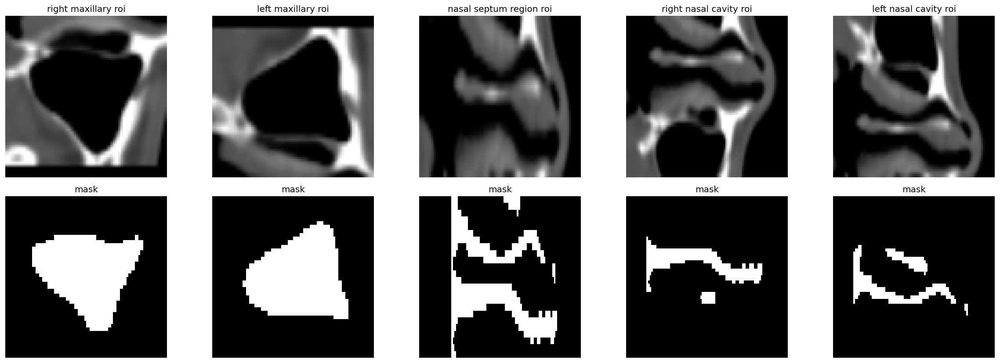

In [12]:
sample_obj = safe_torch_load(cache_path_for_case(case_dicts[0]["case_id"]), map_location="cpu")
validate_cached_object(sample_obj)
print("Case:", sample_obj["case_id"])
print("ROI source:", sample_obj.get("roi_source"))
print("ROIs shape:", tuple(sample_obj["rois"].shape))
print("Target:", {label: int(v) for label, v in zip(TARGET_COLS, sample_obj["target"].tolist())})

rois = sample_obj["rois"].float()
mid_z = rois.shape[-1] // 2
fig, axes = plt.subplots(2, len(ROI_NAMES), figsize=(4 * len(ROI_NAMES), 7), dpi=120)
for i, roi_name in enumerate(ROI_NAMES):
    axes[0, i].imshow(rois[i, 0, :, :, mid_z], cmap="gray", interpolation="nearest")
    axes[0, i].set_title(roi_name.replace("_", " "))
    axes[0, i].axis("off")
    axes[1, i].imshow(rois[i, 1, :, :, mid_z], cmap="gray", interpolation="nearest")
    axes[1, i].set_title("mask")
    axes[1, i].axis("off")
plt.tight_layout()
plt.savefig(os.path.join(CFG["output_dir"], "roi_cache_sanity_check.png"), dpi=140, bbox_inches="tight")
plt.show()

## 13. Dataset, augmentation, and feature utilities

In [13]:
ROI_FEATURE_NAMES = [
    "mean_intensity",
    "std_intensity",
    "p10_intensity",
    "p90_intensity",
    "air_fraction",
    "soft_tissue_fraction",
    "mask_fraction",
]
ROI_FEATURE_DIM = len(ROI_FEATURE_NAMES)

def compute_roi_features(rois):
    if isinstance(rois, np.ndarray):
        rois = torch.from_numpy(rois)
    rois = rois.float()
    ct = rois[:, 0]
    mask = rois[:, 1]
    air_thr = 0.071   # approx -300 HU when [-400, 1000] -> [0,1]
    soft_thr = 0.214  # approx -100 HU
    features = []
    for r in range(ct.shape[0]):
        ct_r = ct[r]
        mask_r = mask[r] > 0.5
        mask_fraction = mask_r.float().mean()
        if mask_r.sum() > 0:
            values = ct_r[mask_r]
            mean_intensity = values.mean()
            std_intensity = values.std(unbiased=False)
            p10_intensity = torch.quantile(values, 0.10)
            p90_intensity = torch.quantile(values, 0.90)
            air_fraction = (values < air_thr).float().mean()
            soft_tissue_fraction = (values > soft_thr).float().mean()
        else:
            mean_intensity = torch.tensor(0.0)
            std_intensity = torch.tensor(0.0)
            p10_intensity = torch.tensor(0.0)
            p90_intensity = torch.tensor(0.0)
            air_fraction = torch.tensor(0.0)
            soft_tissue_fraction = torch.tensor(0.0)
        features.append(torch.stack([
            mean_intensity, std_intensity, p10_intensity, p90_intensity,
            air_fraction, soft_tissue_fraction, mask_fraction,
        ]))
    return torch.stack(features, dim=0).float()

def augment_rois_light(rois):
    rois = rois.clone().float()
    ct = rois[:, 0:1]
    scale_low, scale_high = CFG["ct_aug_scale_range"]
    shift_low, shift_high = CFG["ct_aug_shift_range"]
    scale = torch.empty((ct.shape[0], 1, 1, 1, 1), dtype=ct.dtype).uniform_(scale_low, scale_high)
    shift = torch.empty((ct.shape[0], 1, 1, 1, 1), dtype=ct.dtype).uniform_(shift_low, shift_high)
    ct = ct * scale + shift
    if CFG["ct_aug_noise_std"] > 0:
        ct = ct + torch.randn_like(ct) * float(CFG["ct_aug_noise_std"])

    # Small coarse dropout in CT only, not in the mask channel.
    if random.random() < float(CFG["coarse_dropout_prob"]):
        _, _, sx, sy, sz = ct.shape
        frac = random.uniform(0.05, float(CFG["coarse_dropout_max_fraction"]))
        bx = max(2, int(sx * frac))
        by = max(2, int(sy * frac))
        bz = max(2, int(sz * frac))
        x0 = random.randint(0, max(0, sx - bx))
        y0 = random.randint(0, max(0, sy - by))
        z0 = random.randint(0, max(0, sz - bz))
        ct[:, :, x0:x0+bx, y0:y0+by, z0:z0+bz] = 0.0

    rois[:, 0:1] = ct.clamp(0.0, 1.0)
    return rois

class ROICacheDataset(Dataset):
    def __init__(self, items, augment=False):
        self.items = list(items)
        self.augment = bool(augment)
    def __len__(self):
        return len(self.items)
    def __getitem__(self, idx):
        item = self.items[idx]
        obj = safe_torch_load(cache_path_for_case(item["case_id"]), map_location="cpu")
        rois = obj["rois"].float()
        if self.augment:
            rois = augment_rois_light(rois)
        target = obj["target"].float()
        roi_features = compute_roi_features(rois)
        return {
            "case_id": obj["case_id"],
            "rois": rois,
            "roi_features": roi_features,
            "target": target,
        }

def collate_roi_batch(batch):
    return {
        "case_id": [b["case_id"] for b in batch],
        "rois": torch.stack([b["rois"] for b in batch], dim=0),
        "roi_features": torch.stack([b["roi_features"] for b in batch], dim=0),
        "target": torch.stack([b["target"] for b in batch], dim=0),
    }

sample_ds = ROICacheDataset([case_dicts[0]], augment=True)
sample = sample_ds[0]
print("Dataset sample rois:", tuple(sample["rois"].shape))
print("Dataset sample roi_features:", tuple(sample["roi_features"].shape))
print("Dataset sample target:", tuple(sample["target"].shape))

Dataset sample rois: (5, 2, 96, 96, 96)
Dataset sample roi_features: (5, 7)
Dataset sample target: (5,)


## 14. Model definitions

In [14]:
class BasicBlock3D(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super().__init__()
        self.conv1 = nn.Conv3d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.InstanceNorm3d(out_channels, affine=True)
        self.conv2 = nn.Conv3d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.InstanceNorm3d(out_channels, affine=True)
        self.relu = nn.ReLU(inplace=True)
        if stride != 1 or in_channels != out_channels:
            self.downsample = nn.Sequential(
                nn.Conv3d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                nn.InstanceNorm3d(out_channels, affine=True),
            )
        else:
            self.downsample = nn.Identity()
    def forward(self, x):
        identity = self.downsample(x)
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out = self.relu(out + identity)
        return out

class ResNet3DEncoder(nn.Module):
    def __init__(self, in_channels=2, base_channels=12, feature_dim=192):
        super().__init__()
        self.stem = nn.Sequential(
            nn.Conv3d(in_channels, base_channels, kernel_size=5, stride=2, padding=2, bias=False),
            nn.InstanceNorm3d(base_channels, affine=True),
            nn.ReLU(inplace=True),
        )
        self.layer1 = self._make_layer(base_channels, base_channels, blocks=2, stride=1)
        self.layer2 = self._make_layer(base_channels, base_channels * 2, blocks=2, stride=2)
        self.layer3 = self._make_layer(base_channels * 2, base_channels * 4, blocks=2, stride=2)
        self.layer4 = self._make_layer(base_channels * 4, base_channels * 8, blocks=2, stride=2)
        self.pool = nn.AdaptiveAvgPool3d(1)
        self.proj = nn.Sequential(nn.Flatten(), nn.Linear(base_channels * 8, feature_dim), nn.ReLU(inplace=True), nn.Dropout(0.20))
    def _make_layer(self, in_ch, out_ch, blocks, stride):
        layers = [BasicBlock3D(in_ch, out_ch, stride=stride)]
        for _ in range(1, blocks):
            layers.append(BasicBlock3D(out_ch, out_ch, stride=1))
        return nn.Sequential(*layers)
    def forward(self, x):
        x = self.stem(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.pool(x)
        return self.proj(x)

class MultiROIResNet18Classifier(nn.Module):
    def __init__(self, roi_names, target_cols, label_to_roi, in_channels=2, base_channels=12, feature_dim=192):
        super().__init__()
        self.roi_names = list(roi_names)
        self.target_cols = list(target_cols)
        self.label_to_roi = dict(label_to_roi)
        self.encoder = ResNet3DEncoder(in_channels=in_channels, base_channels=base_channels, feature_dim=feature_dim)
        self.heads = nn.ModuleDict()
        for label in self.target_cols:
            self.heads[label] = nn.Sequential(
                nn.Linear(feature_dim + ROI_FEATURE_DIM, feature_dim // 2),
                nn.ReLU(inplace=True),
                nn.Dropout(0.25),
                nn.Linear(feature_dim // 2, 1),
            )
    def forward(self, rois, roi_features):
        # rois: [B, R, C, X, Y, Z]
        b, r, c, x, y, z = rois.shape
        x_in = rois.reshape(b * r, c, x, y, z)
        feats = self.encoder(x_in).reshape(b, r, -1)
        logits = []
        for label in self.target_cols:
            roi_index = self.label_to_roi[label]
            combined = torch.cat([feats[:, roi_index, :], roi_features[:, roi_index, :]], dim=1)
            logits.append(self.heads[label](combined))
        return torch.cat(logits, dim=1)

# ----------------------------
# 2.5D transfer-learning models
# ----------------------------

def rois_to_2p5d_images(rois, out_size=224):
    # rois: [B, R, 2, X, Y, Z], uses CT channel only.
    ct = rois[:, :, 0].float()
    b, r, x, y, z = ct.shape
    xm, ym, zm = x // 2, y // 2, z // 2

    axial = ct[:, :, :, :, zm].reshape(b * r, x, y)
    coronal = ct[:, :, :, ym, :].reshape(b * r, x, z)
    sagittal = ct[:, :, xm, :, :].reshape(b * r, y, z)

    def resize_plane(p):
        return F.interpolate(p.unsqueeze(1), size=(out_size, out_size), mode="bilinear", align_corners=False).squeeze(1)

    axial = resize_plane(axial)
    coronal = resize_plane(coronal)
    sagittal = resize_plane(sagittal)
    imgs = torch.stack([axial, coronal, sagittal], dim=1)  # [B*R, 3, H, W]
    return imgs.clamp(0.0, 1.0)


def try_load_weights(weights_enum):
    try:
        return weights_enum.DEFAULT
    except Exception:
        return None

def set_module_trainable(module, trainable):
    for p in module.parameters():
        p.requires_grad = bool(trainable)

def get_torchvision_weights(enum_name, pretrained=True):
    if not pretrained:
        return None
    if not hasattr(models, enum_name):
        print(f"Warning: torchvision.models has no {enum_name}; using random initialization.")
        return None
    return try_load_weights(getattr(models, enum_name))

def build_torchvision_backbone(backbone_name, pretrained=True):
    """Builds a Torchvision backbone and replaces its classification head with Identity.

    Supported backbones are intentionally chosen from official torchvision APIs:
    EfficientNet-B0/B1, ConvNeXt-Tiny/Small, ViT-B/16, and Swin-T.
    """
    if backbone_name == "efficientnet_b0":
        weights = get_torchvision_weights("EfficientNet_B0_Weights", pretrained)
        builder = getattr(models, "efficientnet_b0")
        try:
            backbone = builder(weights=weights)
        except Exception as e:
            print("Could not load EfficientNet-B0 pretrained weights. Falling back to random init. Error:", repr(e))
            backbone = builder(weights=None)
        feature_dim = backbone.classifier[1].in_features
        backbone.classifier = nn.Identity()
        return backbone, feature_dim

    if backbone_name == "efficientnet_b1":
        weights = get_torchvision_weights("EfficientNet_B1_Weights", pretrained)
        builder = getattr(models, "efficientnet_b1")
        try:
            backbone = builder(weights=weights)
        except Exception as e:
            print("Could not load EfficientNet-B1 pretrained weights. Falling back to random init. Error:", repr(e))
            backbone = builder(weights=None)
        feature_dim = backbone.classifier[1].in_features
        backbone.classifier = nn.Identity()
        return backbone, feature_dim

    if backbone_name == "convnext_tiny":
        weights = get_torchvision_weights("ConvNeXt_Tiny_Weights", pretrained)
        builder = getattr(models, "convnext_tiny")
        try:
            backbone = builder(weights=weights)
        except Exception as e:
            print("Could not load ConvNeXt-Tiny pretrained weights. Falling back to random init. Error:", repr(e))
            backbone = builder(weights=None)
        feature_dim = backbone.classifier[2].in_features
        backbone.classifier = nn.Identity()
        return backbone, feature_dim

    if backbone_name == "convnext_small":
        if not hasattr(models, "convnext_small"):
            raise RuntimeError("This torchvision version does not expose models.convnext_small. Update torchvision or remove this experiment.")
        weights = get_torchvision_weights("ConvNeXt_Small_Weights", pretrained)
        builder = getattr(models, "convnext_small")
        try:
            backbone = builder(weights=weights)
        except Exception as e:
            print("Could not load ConvNeXt-Small pretrained weights. Falling back to random init. Error:", repr(e))
            backbone = builder(weights=None)
        feature_dim = backbone.classifier[2].in_features
        backbone.classifier = nn.Identity()
        return backbone, feature_dim

    if backbone_name == "vit_b_16":
        if not hasattr(models, "vit_b_16"):
            raise RuntimeError("This torchvision version does not expose models.vit_b_16. Update torchvision or remove this experiment.")
        weights = get_torchvision_weights("ViT_B_16_Weights", pretrained)
        builder = getattr(models, "vit_b_16")
        try:
            backbone = builder(weights=weights)
        except Exception as e:
            print("Could not load ViT-B/16 pretrained weights. Falling back to random init. Error:", repr(e))
            backbone = builder(weights=None)
        # Torchvision VisionTransformer uses model.heads.head for the final classifier.
        feature_dim = backbone.heads.head.in_features
        backbone.heads = nn.Identity()
        return backbone, feature_dim

    if backbone_name == "swin_t":
        if not hasattr(models, "swin_t"):
            raise RuntimeError("This torchvision version does not expose models.swin_t. Update torchvision or remove this experiment.")
        weights = get_torchvision_weights("Swin_T_Weights", pretrained)
        builder = getattr(models, "swin_t")
        try:
            backbone = builder(weights=weights)
        except Exception as e:
            print("Could not load Swin-T pretrained weights. Falling back to random init. Error:", repr(e))
            backbone = builder(weights=None)
        # Torchvision SwinTransformer uses model.head for the final classifier.
        feature_dim = backbone.head.in_features
        backbone.head = nn.Identity()
        return backbone, feature_dim

    raise ValueError(f"Unknown 2D backbone: {backbone_name}")

class MultiROITransfer2DClassifier(nn.Module):
    def __init__(self, backbone_name, roi_names, target_cols, label_to_roi, pretrained=True, out_size=224, head_dropout=0.35):
        super().__init__()
        self.backbone_name = backbone_name
        self.roi_names = list(roi_names)
        self.target_cols = list(target_cols)
        self.label_to_roi = dict(label_to_roi)
        self.out_size = int(out_size)
        self.register_buffer("mean", torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1), persistent=False)
        self.register_buffer("std", torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1), persistent=False)

        backbone, feature_dim = build_torchvision_backbone(backbone_name, pretrained=pretrained)
        self.backbone = backbone
        self.feature_dim = int(feature_dim)
        hidden_dim = 384 if self.feature_dim >= 768 else 256
        self.heads = nn.ModuleDict()
        for label in self.target_cols:
            self.heads[label] = nn.Sequential(
                nn.Linear(self.feature_dim + ROI_FEATURE_DIM, hidden_dim),
                nn.ReLU(inplace=True),
                nn.Dropout(float(head_dropout)),
                nn.Linear(hidden_dim, 1),
            )
    def set_backbone_trainable(self, trainable):
        set_module_trainable(self.backbone, trainable)
    def forward(self, rois, roi_features):
        b, r = rois.shape[:2]
        imgs = rois_to_2p5d_images(rois, out_size=self.out_size)
        imgs = (imgs - self.mean) / self.std
        feats = self.backbone(imgs)
        if isinstance(feats, (list, tuple)):
            feats = feats[-1]
        feats = feats.reshape(b, r, -1)
        logits = []
        for label in self.target_cols:
            roi_index = self.label_to_roi[label]
            combined = torch.cat([feats[:, roi_index, :], roi_features[:, roi_index, :]], dim=1)
            logits.append(self.heads[label](combined))
        return torch.cat(logits, dim=1)

# ----------------------------
# SwinUNETR encoder classifier
# ----------------------------

class SwinUNETREncoderROIClassifier(nn.Module):
    def __init__(self, roi_names, target_cols, label_to_roi, ckpt_path=None, freeze_encoder=True):
        super().__init__()
        self.roi_names = list(roi_names)
        self.target_cols = list(target_cols)
        self.label_to_roi = dict(label_to_roi)
        self.freeze_encoder = bool(freeze_encoder)
        self.encoder_model = create_swinunetr_segmenter(img_size_fallback=CFG["roi_size"])
        if ckpt_path is not None and os.path.exists(ckpt_path):
            self.encoder_model = load_segmentation_checkpoint(self.encoder_model, ckpt_path, "cpu")
        else:
            print("Warning: SwinUNETR encoder experiment has no checkpoint; encoder starts randomly.")
        if self.freeze_encoder:
            set_module_trainable(self.encoder_model, False)
        self.feature_dim = self._infer_feature_dim()
        self.heads = nn.ModuleDict()
        for label in self.target_cols:
            self.heads[label] = nn.Sequential(
                nn.Linear(self.feature_dim + ROI_FEATURE_DIM, 256),
                nn.ReLU(inplace=True),
                nn.Dropout(0.35),
                nn.Linear(256, 1),
            )
    def _extract_swin_feature(self, x):
        # x: [N, 1, X, Y, Z]
        if hasattr(self.encoder_model, "swinViT"):
            try:
                hs = self.encoder_model.swinViT(x, getattr(self.encoder_model, "normalize", True))
            except TypeError:
                hs = self.encoder_model.swinViT(x)
            if isinstance(hs, (list, tuple)):
                feat = hs[-1]
            else:
                feat = hs
        else:
            feat = self.encoder_model(x)
        if feat.ndim == 5 and feat.shape[1] < feat.shape[-1]:
            # Convert channels-last [B, D, H, W, C] to channels-first.
            feat = feat.permute(0, 4, 1, 2, 3).contiguous()
        if feat.ndim == 2:
            return feat.float()
        return F.adaptive_avg_pool3d(feat.float(), 1).flatten(1)
    def _infer_feature_dim(self):
        was_training = self.encoder_model.training
        self.encoder_model.eval()
        with torch.no_grad():
            # Try a smaller divisible-by-32 dummy first for speed. Older MONAI builds
            # with fixed img_size may reject it, then we fall back to the real ROI size.
            try:
                dummy = torch.zeros(1, 1, 32, 32, 32)
                feat = self._extract_swin_feature(dummy)
            except Exception:
                dummy = torch.zeros(1, 1, *CFG["roi_size"])
                feat = self._extract_swin_feature(dummy)
            dim = int(feat.shape[1])
        self.encoder_model.train(was_training)
        print("SwinUNETR encoder feature_dim:", dim)
        return dim
    def set_encoder_trainable(self, trainable):
        self.freeze_encoder = not bool(trainable)
        set_module_trainable(self.encoder_model, trainable)
    def forward(self, rois, roi_features):
        # To control memory, encode ROI volumes in a small loop.
        b, r = rois.shape[:2]
        x = rois[:, :, 0:1].reshape(b * r, 1, *rois.shape[-3:])
        feats_list = []
        chunk = 1
        for start in range(0, x.shape[0], chunk):
            x_chunk = x[start:start+chunk]
            if self.freeze_encoder:
                with torch.no_grad():
                    feat = self._extract_swin_feature(x_chunk)
            else:
                feat = self._extract_swin_feature(x_chunk)
            feats_list.append(feat)
        feats = torch.cat(feats_list, dim=0).reshape(b, r, -1)
        logits = []
        for label in self.target_cols:
            roi_index = self.label_to_roi[label]
            combined = torch.cat([feats[:, roi_index, :], roi_features[:, roi_index, :]], dim=1)
            logits.append(self.heads[label](combined))
        return torch.cat(logits, dim=1)

## 15. Losses, metrics, samplers, and train/evaluation helpers

In [15]:
class BinaryFocalLossWithLogits(nn.Module):
    def __init__(self, gamma=2.0, alpha=None, pos_weight=None, reduction="mean"):
        super().__init__()
        self.gamma = float(gamma)
        self.alpha = alpha
        self.reduction = reduction
        if pos_weight is not None:
            self.register_buffer("pos_weight", pos_weight.float())
        else:
            self.pos_weight = None
    def forward(self, logits, targets):
        bce = F.binary_cross_entropy_with_logits(logits, targets, pos_weight=self.pos_weight, reduction="none")
        prob = torch.sigmoid(logits)
        p_t = prob * targets + (1 - prob) * (1 - targets)
        focal_factor = (1 - p_t).clamp(min=1e-6).pow(self.gamma)
        loss = bce * focal_factor
        if self.alpha is not None:
            alpha_t = self.alpha * targets + (1 - self.alpha) * (1 - targets)
            loss = loss * alpha_t
        if self.reduction == "mean":
            return loss.mean()
        if self.reduction == "sum":
            return loss.sum()
        return loss

def compute_pos_weight(train_items):
    y = np.array([d["target"] for d in train_items], dtype=np.float32)
    pos = y.sum(axis=0)
    neg = len(y) - pos
    raw = neg / np.maximum(pos, 1.0)
    if CFG["pos_weight_mode"] == "sqrt":
        weights = np.sqrt(raw)
    else:
        weights = raw
    weights = np.clip(weights, 1.0, CFG["pos_weight_max"])
    return torch.tensor(weights, dtype=torch.float32, device=CFG["device"]), pos, neg

def make_sample_weights(items):
    y = np.array([d["target"] for d in items], dtype=np.float32)
    pos = y.sum(axis=0)
    inv = len(y) / np.maximum(pos, 1.0)
    inv = np.sqrt(inv)
    sample_weights = 1.0 + (y * inv.reshape(1, -1)).sum(axis=1) / max(1, y.shape[1])
    sample_weights = np.clip(sample_weights, 0.5, CFG["sampler_weight_max"])
    return torch.tensor(sample_weights, dtype=torch.double)

def safe_auc(y_true, y_score):
    try:
        if len(np.unique(y_true)) < 2:
            return np.nan
        return roc_auc_score(y_true, y_score)
    except Exception:
        return np.nan

def safe_ap(y_true, y_score):
    try:
        if len(np.unique(y_true)) < 2:
            return np.nan
        return average_precision_score(y_true, y_score)
    except Exception:
        return np.nan

def binary_specificity(y_true_col, y_pred_col):
    y_true_col = np.asarray(y_true_col).astype(int)
    y_pred_col = np.asarray(y_pred_col).astype(int)
    tn = int(((y_true_col == 0) & (y_pred_col == 0)).sum())
    fp = int(((y_true_col == 0) & (y_pred_col == 1)).sum())
    return tn / (tn + fp) if (tn + fp) > 0 else np.nan

def compute_metrics(y_true, y_prob, thresholds=None, strategy="fixed_0p5"):
    y_true = np.asarray(y_true).astype(int)
    y_prob = np.asarray(y_prob).astype(float)
    if thresholds is None:
        thresholds = np.array([0.5] * y_true.shape[1], dtype=float)
    thresholds = np.asarray(thresholds, dtype=float).reshape(1, -1)
    y_pred = (y_prob >= thresholds).astype(int)
    rows = []
    for i, label in enumerate(TARGET_COLS):
        sens = recall_score(y_true[:, i], y_pred[:, i], zero_division=0)
        spec = binary_specificity(y_true[:, i], y_pred[:, i])
        rows.append({
            "label": label,
            "threshold_strategy": strategy,
            "threshold": float(thresholds[0, i]),
            "accuracy": float((y_true[:, i] == y_pred[:, i]).mean()),
            "precision": precision_score(y_true[:, i], y_pred[:, i], zero_division=0),
            "recall_sensitivity": sens,
            "specificity": spec,
            "balanced_accuracy": float(np.nanmean([sens, spec])),
            "f1": f1_score(y_true[:, i], y_pred[:, i], zero_division=0),
            "auc": safe_auc(y_true[:, i], y_prob[:, i]),
            "average_precision": safe_ap(y_true[:, i], y_prob[:, i]),
            "positive_true": int(y_true[:, i].sum()),
            "positive_pred": int(y_pred[:, i].sum()),
        })
    metrics_df = pd.DataFrame(rows)
    macro = {
        "macro_accuracy": float(metrics_df["accuracy"].mean()),
        "macro_precision": float(metrics_df["precision"].mean()),
        "macro_recall_sensitivity": float(metrics_df["recall_sensitivity"].mean()),
        "macro_specificity": float(metrics_df["specificity"].mean(skipna=True)),
        "macro_balanced_accuracy": float(metrics_df["balanced_accuracy"].mean(skipna=True)),
        "macro_f1": float(metrics_df["f1"].mean()),
        "macro_auc": float(metrics_df["auc"].mean(skipna=True)),
        "macro_average_precision": float(metrics_df["average_precision"].mean(skipna=True)),
        "overall_label_accuracy": float((y_true == y_pred).mean()),
        "subset_accuracy_exact_match": float((y_true == y_pred).all(axis=1).mean()),
    }
    return metrics_df, macro


def tune_thresholds(y_true, y_prob, grid=None, strategy="balanced", high_recall_target=None):
    if grid is None:
        grid = CFG["threshold_grid"]
    if high_recall_target is None:
        high_recall_target = CFG["high_recall_target"]
    y_true = np.asarray(y_true).astype(int)
    y_prob = np.asarray(y_prob).astype(float)
    thresholds = []
    for i in range(y_true.shape[1]):
        best_t = 0.5
        best_score = None
        fallback_t = 0.5
        fallback_score = None
        for t in grid:
            t = float(t)
            pred = (y_prob[:, i] >= t).astype(int)
            rec = recall_score(y_true[:, i], pred, zero_division=0)
            prec = precision_score(y_true[:, i], pred, zero_division=0)
            f1 = f1_score(y_true[:, i], pred, zero_division=0)
            spec = binary_specificity(y_true[:, i], pred)
            spec = 0.0 if np.isnan(spec) else spec
            bal = 0.5 * (rec + spec)
            if strategy == "f1":
                score = (f1, bal, -abs(t - 0.5))
            elif strategy == "balanced":
                # Youden's J = sensitivity + specificity - 1; equivalent ordering to balanced accuracy.
                score = (rec + spec - 1.0, f1, -abs(t - 0.5))
            elif strategy == "high_recall":
                # Among thresholds reaching target recall, prefer precision/F1 and the highest threshold.
                # Fallback is maximum recall, then F1/precision, if the target is impossible.
                fallback_tuple = (rec, f1, prec, t)
                if fallback_score is None or fallback_tuple > fallback_score:
                    fallback_score = fallback_tuple
                    fallback_t = t
                if rec >= high_recall_target:
                    score = (prec, f1, t)
                else:
                    score = None
            else:
                raise ValueError(f"Unknown threshold strategy: {strategy}")

            if score is not None and (best_score is None or score > best_score):
                best_score = score
                best_t = t
        if strategy == "high_recall" and best_score is None:
            best_t = fallback_t
        thresholds.append(best_t)
    return np.array(thresholds, dtype=float)

def threshold_bundle(y_true, y_prob):
    return {
        "fixed_0p5": np.array([0.5] * len(TARGET_COLS), dtype=float),
        "f1": tune_thresholds(y_true, y_prob, strategy="f1"),
        "balanced": tune_thresholds(y_true, y_prob, strategy="balanced"),
        "high_recall": tune_thresholds(y_true, y_prob, strategy="high_recall"),
    }

def make_scaler():
    if CFG["device"].type != "cuda":
        return torch.amp.GradScaler(enabled=False) if hasattr(torch, "amp") else None
    try:
        return torch.amp.GradScaler("cuda", enabled=bool(CFG["use_amp"]))
    except TypeError:
        return torch.cuda.amp.GradScaler(enabled=bool(CFG["use_amp"]))

def build_loader(items, batch_size, augment, use_sampler=False):
    ds = ROICacheDataset(items, augment=augment)
    sampler = None
    shuffle = bool(augment)
    if use_sampler:
        weights = make_sample_weights(items)
        sampler = WeightedRandomSampler(weights, num_samples=len(weights), replacement=True)
        shuffle = False
    return DataLoader(
        ds,
        batch_size=batch_size,
        shuffle=shuffle,
        sampler=sampler,
        num_workers=CFG["num_workers"],
        collate_fn=collate_roi_batch,
        pin_memory=(CFG["device"].type == "cuda"),
        persistent_workers=(CFG["num_workers"] > 0),
    )

@torch.no_grad()
def collect_predictions(model, loader, loss_fn):
    model.eval()
    all_case_ids, all_targets, all_probs = [], [], []
    total_loss, n = 0.0, 0
    for batch in tqdm(loader, desc="Predict", leave=False):
        rois = batch["rois"].to(CFG["device"], non_blocking=True)
        roi_features = batch["roi_features"].to(CFG["device"], non_blocking=True)
        targets = batch["target"].to(CFG["device"], non_blocking=True)
        with amp_context():
            logits = model(rois, roi_features)
            loss = loss_fn(logits, targets)
        probs = torch.sigmoid(logits)
        bs = rois.shape[0]
        total_loss += float(loss.item()) * bs
        n += bs
        all_case_ids.extend(batch["case_id"])
        all_targets.append(targets.cpu().numpy())
        all_probs.append(probs.cpu().numpy())
    return all_case_ids, np.concatenate(all_targets, axis=0), np.concatenate(all_probs, axis=0), total_loss / max(n, 1)

def train_one_epoch(model, loader, loss_fn, optimizer, scaler):
    model.train()
    total_loss, n = 0.0, 0
    all_targets, all_probs = [], []
    for batch in tqdm(loader, desc="Train", leave=False):
        rois = batch["rois"].to(CFG["device"], non_blocking=True)
        roi_features = batch["roi_features"].to(CFG["device"], non_blocking=True)
        targets = batch["target"].to(CFG["device"], non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        with amp_context():
            logits = model(rois, roi_features)
            loss = loss_fn(logits, targets)
        scaler.scale(loss).backward()
        if CFG["grad_clip"] is not None:
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), CFG["grad_clip"])
        scaler.step(optimizer)
        scaler.update()
        probs = torch.sigmoid(logits).detach()
        bs = rois.shape[0]
        total_loss += float(loss.item()) * bs
        n += bs
        all_targets.append(targets.detach().cpu().numpy())
        all_probs.append(probs.cpu().numpy())
    y_true = np.concatenate(all_targets, axis=0)
    y_prob = np.concatenate(all_probs, axis=0)
    _, train_macro = compute_metrics(y_true, y_prob, thresholds=None, strategy="fixed_0p5")
    return {"train_loss": total_loss / max(n, 1), **{f"train_{k}": v for k, v in train_macro.items()}}

## 16. Experiment definitions

In [16]:
# Real final experiments only.
CONVNEXT_FINAL_EXPERIMENT = {
    "name": "01_final_convnext_tiny_focal_g1_lr1e4_strict",
    "description": "Final ConvNeXt-Tiny: focal gamma=1 + pos_weight + LR=1e-4 + strict early stopping. Same best family/config as the previous strongest ConvNeXt run.",
    "model_type": "transfer2d",
    "backbone": "convnext_tiny",
    "loss": "focal",
    "focal_gamma": 1.0,
    "pos_weight": True,
    "sampler": False,
    "augment": True,
    "head_lr": 1e-4,
    "backbone_lr": 1e-4,
    "head_dropout": 0.35,
    "septum_roi_mode": "baseline",
}

SWIN_T_FINAL_EXPERIMENT = {
    "name": "02_final_swin_t_focal_g1_diff_lr",
    "description": "Final Swin-T: focal gamma=1 + pos_weight + differential LR. It is the transformer backup because it previously overfit less than other models.",
    "model_type": "transfer2d",
    "backbone": "swin_t",
    "loss": "focal",
    "focal_gamma": 1.0,
    "pos_weight": True,
    "sampler": False,
    "augment": True,
    "head_lr": 1e-4,
    "backbone_lr": 1e-5,
    "head_dropout": 0.35,
    "septum_roi_mode": "baseline",
}

FINAL_EXPERIMENTS = [CONVNEXT_FINAL_EXPERIMENT, SWIN_T_FINAL_EXPERIMENT]

if CFG["quick_debug"]:
    CFG["max_epochs"] = 1
    CFG["early_stop_patience"] = 1
    FINAL_EXPERIMENTS = FINAL_EXPERIMENTS[:1]
    folds = folds[:1]
    print("QUICK DEBUG MODE: running only", len(FINAL_EXPERIMENTS), "experiment and", len(folds), "fold.")

exp_table = pd.DataFrame([{
    "run_order": i + 1,
    "name": e["name"],
    "backbone": e.get("backbone", ""),
    "loss": e.get("loss", ""),
    "focal_gamma": e.get("focal_gamma", ""),
    "sampler": e.get("sampler", False),
    "pos_weight": e.get("pos_weight", False),
    "head_lr": e.get("head_lr", CFG["learning_rate_2d_head"]),
    "backbone_lr": e.get("backbone_lr", CFG["learning_rate_2d_backbone"]),
    "description": e["description"],
} for i, e in enumerate(FINAL_EXPERIMENTS)])
display(exp_table)


,run_order,name,backbone,loss,focal_gamma,sampler,pos_weight,head_lr,backbone_lr,description
0,1,01_final_convnext_tiny_focal_g1_lr1e4_strict,convnext_tiny,focal,1.0,False,True,0.0001,0.00010,Final ConvNeXt-Tiny: focal gamma=1 + pos_weigh...
1,2,02_final_swin_t_focal_g1_diff_lr,swin_t,focal,1.0,False,True,0.0001,0.00001,Final Swin-T: focal gamma=1 + pos_weight + dif...


## 17. Build models, losses, and optimizers

In [17]:
def build_model(exp):
    exp_label_to_roi = label_to_roi_for_experiment(exp)
    if exp["model_type"] == "roi3d_resnet":
        model = MultiROIResNet18Classifier(
            roi_names=ROI_NAMES,
            target_cols=TARGET_COLS,
            label_to_roi=exp_label_to_roi,
            in_channels=CFG["roi_channels"],
            base_channels=12,
            feature_dim=192,
        )
    elif exp["model_type"] == "transfer2d":
        model = MultiROITransfer2DClassifier(
            backbone_name=exp["backbone"],
            roi_names=ROI_NAMES,
            target_cols=TARGET_COLS,
            label_to_roi=exp_label_to_roi,
            pretrained=True,
            out_size=CFG["roi_2d_size"],
            head_dropout=exp.get("head_dropout", 0.35),
        )
        model.set_backbone_trainable(False)
    elif exp["model_type"] == "swin_encoder":
        model = SwinUNETREncoderROIClassifier(
            roi_names=ROI_NAMES,
            target_cols=TARGET_COLS,
            label_to_roi=exp_label_to_roi,
            ckpt_path=CFG["seg_ckpt"],
            freeze_encoder=CFG["freeze_swin_encoder"],
        )
    else:
        raise ValueError(f"Unknown model_type: {exp['model_type']}")
    return model.to(CFG["device"])

def build_loss(exp, train_items):
    pos_weight_tensor, pos, neg = compute_pos_weight(train_items)
    if not exp.get("pos_weight", False):
        pos_weight_tensor = None
    if exp["loss"] == "bce":
        return nn.BCEWithLogitsLoss(pos_weight=pos_weight_tensor), pos, neg, pos_weight_tensor
    if exp["loss"] == "focal":
        return BinaryFocalLossWithLogits(gamma=exp.get("focal_gamma", 2.0), pos_weight=pos_weight_tensor), pos, neg, pos_weight_tensor
    raise ValueError(f"Unknown loss: {exp['loss']}")

def build_optimizer(exp, model):
    if exp["model_type"] == "transfer2d":
        head_lr = float(exp.get("head_lr", CFG["learning_rate_2d_head"]))
        backbone_lr = float(exp.get("backbone_lr", CFG["learning_rate_2d_backbone"]))
        # Include backbone params from the beginning even while frozen.
        # This avoids ReduceLROnPlateau/min_lr issues caused by adding a param group after scheduler creation.
        backbone_params = list(model.backbone.parameters())
        head_params = [p for n, p in model.named_parameters() if not n.startswith("backbone.") and p.requires_grad]
        param_groups = []
        if backbone_params:
            param_groups.append({"params": backbone_params, "lr": backbone_lr})
        if head_params:
            param_groups.append({"params": head_params, "lr": head_lr})
        if not param_groups:
            param_groups = [{"params": model.parameters(), "lr": head_lr}]
        lr_display = head_lr
    elif exp["model_type"] == "swin_encoder":
        encoder_params = [p for n, p in model.named_parameters() if n.startswith("encoder_model.") and p.requires_grad]
        head_params = [p for n, p in model.named_parameters() if not n.startswith("encoder_model.") and p.requires_grad]
        param_groups = []
        if encoder_params:
            param_groups.append({"params": encoder_params, "lr": CFG["learning_rate_swin_encoder"]})
        if head_params:
            param_groups.append({"params": head_params, "lr": CFG["learning_rate_swin_head"]})
        lr_display = CFG["learning_rate_swin_head"]
    else:
        param_groups = [{"params": model.parameters(), "lr": CFG["learning_rate_3d"]}]
        lr_display = CFG["learning_rate_3d"]
    optimizer = torch.optim.AdamW(param_groups, weight_decay=CFG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="max",
        factor=CFG["scheduler_factor"],
        patience=CFG["scheduler_patience"],
        min_lr=CFG["min_lr"],
        threshold=CFG["early_stop_min_delta"],
        threshold_mode="abs",
    )
    return optimizer, scheduler, lr_display

def maybe_unfreeze_backbone(exp, model, optimizer, epoch):
    if exp["model_type"] == "transfer2d" and epoch == CFG["freeze_backbone_epochs"] + 1:
        print("Unfreezing 2D backbone for fine-tuning.")
        model.set_backbone_trainable(True)
        # Backbone parameters are already present in the optimizer from epoch 1,
        # so no new param group is added here.

## 18. Main 5-fold experiment runner

In [18]:
def items_from_indices(indices):
    return [case_dicts[int(i)] for i in indices]

def train_experiment_fold(exp, fold_i, train_items, val_items):
    exp_dir = os.path.join(CFG["output_dir"], exp["name"], f"fold_{fold_i}")
    Path(exp_dir).mkdir(parents=True, exist_ok=True)
    best_ckpt_path = os.path.join(exp_dir, "best_model.pth")  # best monitor/F1 checkpoint
    best_loss_ckpt_path = os.path.join(exp_dir, "best_val_loss_model.pth")
    history_path = os.path.join(exp_dir, "history.csv")
    pred_path = os.path.join(exp_dir, "val_predictions.csv")
    metrics_path = os.path.join(exp_dir, "metrics_per_label.csv")
    done_path = os.path.join(exp_dir, "DONE.json")

    if CFG["skip_finished_folds"] and os.path.exists(done_path) and os.path.exists(pred_path) and os.path.exists(metrics_path):
        print(f"Skipping finished {exp['name']} fold {fold_i}")
        return pd.read_csv(pred_path), pd.read_csv(metrics_path), json.load(open(done_path))

    batch_size = CFG["batch_size_3d"]
    if exp["model_type"] == "transfer2d":
        batch_size = CFG["batch_size_2d"]
    elif exp["model_type"] == "swin_encoder":
        batch_size = CFG["batch_size_swin_encoder"]

    train_loader = build_loader(train_items, batch_size=batch_size, augment=exp.get("augment", True), use_sampler=exp.get("sampler", False))
    val_loader = build_loader(val_items, batch_size=batch_size, augment=False, use_sampler=False)

    model = build_model(exp)
    exp_label_to_roi = label_to_roi_for_experiment(exp)
    loss_fn, pos, neg, pos_weight_tensor = build_loss(exp, train_items)
    optimizer, scheduler, lr_display = build_optimizer(exp, model)
    scaler = make_scaler()

    pos_weight_np = pos_weight_tensor.detach().cpu().numpy() if pos_weight_tensor is not None else np.ones(len(TARGET_COLS))
    class_table = pd.DataFrame({
        "label": TARGET_COLS,
        "display_label": [display_label(l) for l in TARGET_COLS],
        "train_positive": pos.astype(int),
        "train_negative": neg.astype(int),
        "pos_weight_used": pos_weight_np,
    })
    class_table.to_csv(os.path.join(exp_dir, "class_weights.csv"), index=False)

    monitor_metric = CFG["monitor_metric"]
    best_monitor = -1.0
    best_epoch = 0
    best_loss = float("inf")
    best_loss_epoch = 0
    epochs_no_improve = 0
    history = []

    for epoch in range(1, CFG["max_epochs"] + 1):
        maybe_unfreeze_backbone(exp, model, optimizer, epoch)
        t0 = time.time()
        train_stats = train_one_epoch(model, train_loader, loss_fn, optimizer, scaler)
        train_loss = train_stats["train_loss"]
        val_case_ids, val_y_true, val_y_prob, val_loss = collect_predictions(model, val_loader, loss_fn)

        fixed_metrics_df, fixed_macro = compute_metrics(val_y_true, val_y_prob, thresholds=None, strategy="fixed_0p5")

        epoch_f1_thresholds = tune_thresholds(val_y_true, val_y_prob, strategy="f1")
        _, f1_macro = compute_metrics(val_y_true, val_y_prob, thresholds=epoch_f1_thresholds, strategy="f1")

        epoch_balanced_thresholds = tune_thresholds(val_y_true, val_y_prob, strategy="balanced")
        _, balanced_macro = compute_metrics(val_y_true, val_y_prob, thresholds=epoch_balanced_thresholds, strategy="balanced")

        epoch_high_recall_thresholds = tune_thresholds(val_y_true, val_y_prob, strategy="high_recall")
        _, high_recall_macro = compute_metrics(val_y_true, val_y_prob, thresholds=epoch_high_recall_thresholds, strategy="high_recall")

        # Primary monitor is macro F1 with F1 thresholds unless CFG is changed.
        monitor_value = f1_macro.get(monitor_metric, fixed_macro.get(monitor_metric, f1_macro["macro_f1"]))
        scheduler.step(monitor_value)

        current_lr_min = min(g["lr"] for g in optimizer.param_groups)
        current_lr_max = max(g["lr"] for g in optimizer.param_groups)
        row = {
            "experiment": exp["name"],
            "fold": fold_i,
            "epoch": epoch,
            "train_loss": train_loss,
            "val_loss": val_loss,
            **train_stats,
            **{f"val_fixed_{k}": v for k, v in fixed_macro.items()},
            **{f"val_f1_{k}": v for k, v in f1_macro.items()},
            **{f"val_balanced_{k}": v for k, v in balanced_macro.items()},
            **{f"val_high_recall_{k}": v for k, v in high_recall_macro.items()},
            "monitor_metric": monitor_metric,
            "monitor_value": monitor_value,
            "lr_min": current_lr_min,
            "lr_max": current_lr_max,
            "seconds": time.time() - t0,
        }
        history.append(row)
        pd.DataFrame(history).to_csv(history_path, index=False)
        print(
            f"[{exp['name']} | fold {fold_i} | epoch {epoch:02d}] "
            f"train_loss={train_loss:.4f} val_loss={val_loss:.4f} "
            f"val_macro_f1@0.5={fixed_macro['macro_f1']:.4f} "
            f"val_f1_thr_macro_f1={f1_macro['macro_f1']:.4f} "
            f"val_bal_acc={balanced_macro['macro_balanced_accuracy']:.4f} "
            f"lr_min={current_lr_min:.2e} lr_max={current_lr_max:.2e}"
        )

        checkpoint_payload = {
            "experiment": exp,
            "fold": fold_i,
            "epoch": epoch,
            "monitor_metric": monitor_metric,
            "monitor_value": float(monitor_value),
            "val_loss": float(val_loss),
            "model_state_dict": model.state_dict(),
            "target_cols": TARGET_COLS,
            "display_label_names": DISPLAY_LABEL_NAMES,
            "roi_names": ROI_NAMES,
            "label_to_roi": exp_label_to_roi,
            "cfg": {k: str(v) if isinstance(v, Path) else v for k, v in CFG.items() if k != "device"},
        }

        if monitor_value > best_monitor + CFG["early_stop_min_delta"]:
            best_monitor = monitor_value
            best_epoch = epoch
            epochs_no_improve = 0
            checkpoint_payload["checkpoint_type"] = "best_monitor"
            torch.save(checkpoint_payload, best_ckpt_path)
            print("  Saved best-F1/monitor checkpoint:", best_ckpt_path)
        else:
            epochs_no_improve += 1
            print(f"  No monitor improvement: {epochs_no_improve}/{CFG['early_stop_patience']}")

        if val_loss < best_loss - 1e-6:
            best_loss = float(val_loss)
            best_loss_epoch = epoch
            checkpoint_payload_loss = dict(checkpoint_payload)
            checkpoint_payload_loss["checkpoint_type"] = "best_val_loss"
            torch.save(checkpoint_payload_loss, best_loss_ckpt_path)
            print("  Saved best-val-loss checkpoint:", best_loss_ckpt_path)

        if epochs_no_improve >= CFG["early_stop_patience"]:
            print("  Early stopping triggered.")
            break

    # Final validation predictions use the best monitor/F1 checkpoint.
    checkpoint = safe_torch_load(best_ckpt_path, map_location=CFG["device"])
    model.load_state_dict(checkpoint["model_state_dict"])
    val_case_ids, val_y_true, val_y_prob, val_loss = collect_predictions(model, val_loader, loss_fn)

    thrs = threshold_bundle(val_y_true, val_y_prob)
    all_metrics = []
    macro_by_strategy = {}
    for strategy, thr in thrs.items():
        mdf, macro = compute_metrics(val_y_true, val_y_prob, thresholds=thr, strategy=strategy)
        all_metrics.append(mdf)
        macro_by_strategy[strategy] = macro
    metrics_df = pd.concat(all_metrics, ignore_index=True)

    primary = CFG["primary_threshold_strategy"]
    primary_thresholds = thrs[primary]
    pred_df = pd.DataFrame({"case_id": val_case_ids, "experiment": exp["name"], "fold": fold_i})
    for i, label in enumerate(TARGET_COLS):
        pred_df[f"true_{label}"] = val_y_true[:, i].astype(int)
        pred_df[f"prob_{label}"] = val_y_prob[:, i].astype(float)
        for strategy, thr in thrs.items():
            pred_df[f"pred_{strategy}_{label}"] = (val_y_prob[:, i] >= thr[i]).astype(int)
        pred_df[f"pred_{label}"] = pred_df[f"pred_{primary}_{label}"]  # backward-compatible primary prediction
    pred_df.to_csv(pred_path, index=False)

    metrics_df.insert(0, "experiment", exp["name"])
    metrics_df.insert(1, "fold", fold_i)
    metrics_df.insert(2, "display_label", metrics_df["label"].map(display_label))
    metrics_df.to_csv(metrics_path, index=False)

    primary_macro = macro_by_strategy[primary]
    done = {
        "experiment": exp["name"],
        "fold": fold_i,
        "best_epoch": int(best_epoch),
        "best_monitor_metric": monitor_metric,
        "best_monitor_value": float(best_monitor),
        "best_val_loss_epoch": int(best_loss_epoch),
        "best_val_loss_value": float(best_loss),
        "best_monitor_checkpoint": best_ckpt_path,
        "best_val_loss_checkpoint": best_loss_ckpt_path,
        "primary_threshold_strategy": primary,
        "septum_roi_mode": exp.get("septum_roi_mode", "baseline"),
        "thresholds_fixed_0p5": {label: float(thr) for label, thr in zip(TARGET_COLS, thrs["fixed_0p5"])},
        "thresholds_f1": {label: float(thr) for label, thr in zip(TARGET_COLS, thrs["f1"])},
        "thresholds_balanced": {label: float(thr) for label, thr in zip(TARGET_COLS, thrs["balanced"])},
        "thresholds_high_recall": {label: float(thr) for label, thr in zip(TARGET_COLS, thrs["high_recall"])},
        **{k: float(v) for k, v in primary_macro.items()},
        **{f"fixed_0p5_{k}": float(v) for k, v in macro_by_strategy["fixed_0p5"].items()},
        **{f"f1_{k}": float(v) for k, v in macro_by_strategy["f1"].items()},
        **{f"balanced_{k}": float(v) for k, v in macro_by_strategy["balanced"].items()},
        **{f"high_recall_{k}": float(v) for k, v in macro_by_strategy["high_recall"].items()},
        "val_loss_best_checkpoint": float(val_loss),
    }
    with open(done_path, "w") as f:
        json.dump(done, f, indent=2)

    del model, optimizer, scheduler, scaler, train_loader, val_loader
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return pred_df, metrics_df, done

all_fold_summaries = []
all_pred_dfs = []
all_metric_dfs = []


def run_single_experiment(exp):
    global all_fold_summaries, all_pred_dfs, all_metric_dfs
    all_fold_summaries = [s for s in all_fold_summaries if s.get("experiment") != exp["name"]]
    all_pred_dfs = [df for df in all_pred_dfs if not ("experiment" in df.columns and (df["experiment"] == exp["name"]).any())]
    all_metric_dfs = [df for df in all_metric_dfs if not ("experiment" in df.columns and (df["experiment"] == exp["name"]).any())]

    local_pred_dfs, local_metric_dfs, local_summaries = [], [], []
    all_indices = np.arange(len(case_dicts))
    print("\n" + "=" * 110)
    print("STARTING FINAL EXPERIMENT:", exp["name"])
    print(exp["description"])
    print("=" * 110)

    for fold_i, val_idx in enumerate(folds):
        val_set = set(int(i) for i in val_idx)
        train_idx = [int(i) for i in all_indices if int(i) not in val_set]
        train_items = items_from_indices(train_idx)
        val_items = items_from_indices(val_idx)
        print(f"\n{exp['name']} | Fold {fold_i}: train={len(train_items)} val={len(val_items)}")
        pred_df, metrics_df, done = train_experiment_fold(exp, fold_i, train_items, val_items)
        local_pred_dfs.append(pred_df); local_metric_dfs.append(metrics_df); local_summaries.append(done)
        all_pred_dfs.append(pred_df); all_metric_dfs.append(metrics_df); all_fold_summaries.append(done)
        pd.DataFrame(all_fold_summaries).to_csv(os.path.join(CFG["output_dir"], "fold_summary_live.csv"), index=False)

    summary_df = pd.DataFrame(all_fold_summaries)
    summary_df.to_csv(os.path.join(CFG["output_dir"], "fold_summary_all_experiments.csv"), index=False)
    return local_pred_dfs, local_metric_dfs, local_summaries


def summarize_experiment_from_folds(exp_name):
    rows = [s for s in all_fold_summaries if s.get("experiment") == exp_name]
    if not rows:
        print("No results found for", exp_name)
        return None
    df = pd.DataFrame(rows)
    cols = ["fold", "best_epoch", "best_val_loss_epoch", "macro_f1", "macro_auc", "macro_average_precision", "macro_recall_sensitivity", "macro_specificity", "macro_balanced_accuracy", "overall_label_accuracy", "subset_accuracy_exact_match", "val_loss_best_checkpoint"]
    cols = [c for c in cols if c in df.columns]
    print("\nFold-level results for:", exp_name)
    display(df[cols].sort_values("fold"))
    metrics = ["macro_f1", "macro_auc", "macro_average_precision", "macro_recall_sensitivity", "macro_specificity", "macro_balanced_accuracy", "overall_label_accuracy", "subset_accuracy_exact_match"]
    summary = df[metrics].agg(["mean", "std"]).T.reset_index()
    summary.columns = ["metric", "mean", "std"]
    print("\n5-fold mean ± std:")
    display(summary)
    exp_metrics = [m for m in all_metric_dfs if "experiment" in m.columns and (m["experiment"] == exp_name).any()]
    if exp_metrics:
        mdf = pd.concat(exp_metrics, ignore_index=True)
        primary = CFG["primary_threshold_strategy"]
        per_label = (mdf[mdf["threshold_strategy"] == primary]
            .groupby(["label", "display_label"])[["f1", "precision", "recall_sensitivity", "specificity", "balanced_accuracy", "auc", "average_precision"]]
            .mean().reset_index())
        print(f"\nPer-label fold-mean metrics using {primary} thresholds:")
        display(per_label)
    return df


## 19. Run final ConvNeXt-Tiny experiment first

In [19]:
convnext_pred_dfs, convnext_metric_dfs, convnext_summaries = run_single_experiment(CONVNEXT_FINAL_EXPERIMENT)
convnext_summary_df = summarize_experiment_from_folds(CONVNEXT_FINAL_EXPERIMENT["name"])



STARTING FINAL EXPERIMENT: 01_final_convnext_tiny_focal_g1_lr1e4_strict
Final ConvNeXt-Tiny: focal gamma=1 + pos_weight + LR=1e-4 + strict early stopping. Same best family/config as the previous strongest ConvNeXt run.

01_final_convnext_tiny_focal_g1_lr1e4_strict | Fold 0: train=104 val=26
Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth


100%|██████████| 109M/109M [00:00<00:00, 165MB/s]  


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 01] train_loss=0.3669 val_loss=0.3652 val_macro_f1@0.5=0.1641 val_f1_thr_macro_f1=0.5016 val_bal_acc=0.5446 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_0/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_0/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 02] train_loss=0.3553 val_loss=0.3626 val_macro_f1@0.5=0.1708 val_f1_thr_macro_f1=0.5038 val_bal_acc=0.5634 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_0/best_val_loss_model.pth
Unfreezing 2D backbone for fine-tuning.


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 03] train_loss=0.3669 val_loss=0.3813 val_macro_f1@0.5=0.2511 val_f1_thr_macro_f1=0.6054 val_bal_acc=0.6516 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_0/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 04] train_loss=0.3502 val_loss=0.4597 val_macro_f1@0.5=0.3294 val_f1_thr_macro_f1=0.5829 val_bal_acc=0.6554 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 05] train_loss=0.3337 val_loss=0.3507 val_macro_f1@0.5=0.3133 val_f1_thr_macro_f1=0.6607 val_bal_acc=0.7312 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_0/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_0/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 06] train_loss=0.2194 val_loss=0.4217 val_macro_f1@0.5=0.3774 val_f1_thr_macro_f1=0.6995 val_bal_acc=0.7819 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_0/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 07] train_loss=0.1562 val_loss=0.4560 val_macro_f1@0.5=0.6138 val_f1_thr_macro_f1=0.6967 val_bal_acc=0.7513 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 08] train_loss=0.1367 val_loss=0.4083 val_macro_f1@0.5=0.5481 val_f1_thr_macro_f1=0.7050 val_bal_acc=0.7798 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_0/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 09] train_loss=0.1370 val_loss=0.3996 val_macro_f1@0.5=0.6183 val_f1_thr_macro_f1=0.7377 val_bal_acc=0.7991 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_0/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 10] train_loss=0.0689 val_loss=0.7056 val_macro_f1@0.5=0.4534 val_f1_thr_macro_f1=0.6491 val_bal_acc=0.7492 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 11] train_loss=0.0892 val_loss=0.6200 val_macro_f1@0.5=0.6046 val_f1_thr_macro_f1=0.7465 val_bal_acc=0.8085 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_0/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 12] train_loss=0.0576 val_loss=0.6576 val_macro_f1@0.5=0.5483 val_f1_thr_macro_f1=0.6612 val_bal_acc=0.7501 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 13] train_loss=0.0863 val_loss=0.6579 val_macro_f1@0.5=0.5013 val_f1_thr_macro_f1=0.6658 val_bal_acc=0.7579 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 0 | epoch 14] train_loss=0.0595 val_loss=0.9945 val_macro_f1@0.5=0.5164 val_f1_thr_macro_f1=0.7269 val_bal_acc=0.7860 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 3/3
  Early stopping triggered.


Predict:   0%|          | 0/7 [00:00<?, ?it/s]


01_final_convnext_tiny_focal_g1_lr1e4_strict | Fold 1: train=104 val=26


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 1 | epoch 01] train_loss=0.3725 val_loss=0.3699 val_macro_f1@0.5=0.1333 val_f1_thr_macro_f1=0.6314 val_bal_acc=0.6214 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_1/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 1 | epoch 02] train_loss=0.3602 val_loss=0.3637 val_macro_f1@0.5=0.1405 val_f1_thr_macro_f1=0.6644 val_bal_acc=0.6750 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_1/best_val_loss_model.pth
Unfreezing 2D backbone for fine-tuning.


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 1 | epoch 03] train_loss=0.3686 val_loss=0.3570 val_macro_f1@0.5=0.2733 val_f1_thr_macro_f1=0.7081 val_bal_acc=0.7266 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_1/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 1 | epoch 04] train_loss=0.3537 val_loss=0.3423 val_macro_f1@0.5=0.4560 val_f1_thr_macro_f1=0.7406 val_bal_acc=0.7771 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_1/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 1 | epoch 05] train_loss=0.2985 val_loss=0.3040 val_macro_f1@0.5=0.5521 val_f1_thr_macro_f1=0.7591 val_bal_acc=0.7947 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_1/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 1 | epoch 06] train_loss=0.2424 val_loss=0.3123 val_macro_f1@0.5=0.6461 val_f1_thr_macro_f1=0.7354 val_bal_acc=0.7906 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 1 | epoch 07] train_loss=0.1632 val_loss=0.4417 val_macro_f1@0.5=0.4997 val_f1_thr_macro_f1=0.6951 val_bal_acc=0.7858 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 1 | epoch 08] train_loss=0.0984 val_loss=0.5136 val_macro_f1@0.5=0.5900 val_f1_thr_macro_f1=0.7563 val_bal_acc=0.8261 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 3/3
  Early stopping triggered.


Predict:   0%|          | 0/7 [00:00<?, ?it/s]


01_final_convnext_tiny_focal_g1_lr1e4_strict | Fold 2: train=104 val=26


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 01] train_loss=0.3709 val_loss=0.3602 val_macro_f1@0.5=0.1771 val_f1_thr_macro_f1=0.5507 val_bal_acc=0.5907 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 02] train_loss=0.3612 val_loss=0.3552 val_macro_f1@0.5=0.1771 val_f1_thr_macro_f1=0.5364 val_bal_acc=0.6007 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_val_loss_model.pth
Unfreezing 2D backbone for fine-tuning.


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 03] train_loss=0.3764 val_loss=0.3578 val_macro_f1@0.5=0.3171 val_f1_thr_macro_f1=0.6207 val_bal_acc=0.6479 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 04] train_loss=0.3567 val_loss=0.3495 val_macro_f1@0.5=0.1498 val_f1_thr_macro_f1=0.7099 val_bal_acc=0.7386 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 05] train_loss=0.3343 val_loss=0.3478 val_macro_f1@0.5=0.5349 val_f1_thr_macro_f1=0.7402 val_bal_acc=0.7926 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 06] train_loss=0.3077 val_loss=0.3034 val_macro_f1@0.5=0.4175 val_f1_thr_macro_f1=0.7389 val_bal_acc=0.7928 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 07] train_loss=0.2087 val_loss=0.3015 val_macro_f1@0.5=0.6744 val_f1_thr_macro_f1=0.7567 val_bal_acc=0.8362 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 08] train_loss=0.1658 val_loss=0.3671 val_macro_f1@0.5=0.6317 val_f1_thr_macro_f1=0.7855 val_bal_acc=0.8357 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_2/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 09] train_loss=0.1507 val_loss=0.6552 val_macro_f1@0.5=0.5014 val_f1_thr_macro_f1=0.6962 val_bal_acc=0.7913 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 10] train_loss=0.1098 val_loss=0.7426 val_macro_f1@0.5=0.6223 val_f1_thr_macro_f1=0.7145 val_bal_acc=0.7834 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 2 | epoch 11] train_loss=0.0717 val_loss=0.7267 val_macro_f1@0.5=0.6681 val_f1_thr_macro_f1=0.7302 val_bal_acc=0.8056 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 3/3
  Early stopping triggered.


Predict:   0%|          | 0/7 [00:00<?, ?it/s]


01_final_convnext_tiny_focal_g1_lr1e4_strict | Fold 3: train=104 val=26


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 3 | epoch 01] train_loss=0.3707 val_loss=0.3719 val_macro_f1@0.5=0.2352 val_f1_thr_macro_f1=0.5498 val_bal_acc=0.6011 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_3/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_3/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 3 | epoch 02] train_loss=0.3577 val_loss=0.3699 val_macro_f1@0.5=0.2694 val_f1_thr_macro_f1=0.5882 val_bal_acc=0.6584 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_3/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_3/best_val_loss_model.pth
Unfreezing 2D backbone for fine-tuning.


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 3 | epoch 03] train_loss=0.3666 val_loss=0.3725 val_macro_f1@0.5=0.1333 val_f1_thr_macro_f1=0.6065 val_bal_acc=0.6508 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_3/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 3 | epoch 04] train_loss=0.3603 val_loss=0.3786 val_macro_f1@0.5=0.3150 val_f1_thr_macro_f1=0.7283 val_bal_acc=0.7736 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_3/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 3 | epoch 05] train_loss=0.3404 val_loss=0.4341 val_macro_f1@0.5=0.4461 val_f1_thr_macro_f1=0.7341 val_bal_acc=0.7542 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_3/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 3 | epoch 06] train_loss=0.2552 val_loss=0.3443 val_macro_f1@0.5=0.6250 val_f1_thr_macro_f1=0.7115 val_bal_acc=0.7778 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_3/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 3 | epoch 07] train_loss=0.1814 val_loss=0.4547 val_macro_f1@0.5=0.5413 val_f1_thr_macro_f1=0.7998 val_bal_acc=0.8397 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_3/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 3 | epoch 08] train_loss=0.1133 val_loss=0.4952 val_macro_f1@0.5=0.5873 val_f1_thr_macro_f1=0.7998 val_bal_acc=0.8252 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 3 | epoch 09] train_loss=0.0837 val_loss=0.6840 val_macro_f1@0.5=0.5936 val_f1_thr_macro_f1=0.7469 val_bal_acc=0.7925 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 3 | epoch 10] train_loss=0.0775 val_loss=0.8812 val_macro_f1@0.5=0.5460 val_f1_thr_macro_f1=0.7046 val_bal_acc=0.7469 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 3/3
  Early stopping triggered.


Predict:   0%|          | 0/7 [00:00<?, ?it/s]


01_final_convnext_tiny_focal_g1_lr1e4_strict | Fold 4: train=104 val=26


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 01] train_loss=0.3719 val_loss=0.3657 val_macro_f1@0.5=0.3383 val_f1_thr_macro_f1=0.5319 val_bal_acc=0.5798 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 02] train_loss=0.3573 val_loss=0.3599 val_macro_f1@0.5=0.2463 val_f1_thr_macro_f1=0.5424 val_bal_acc=0.6438 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_val_loss_model.pth
Unfreezing 2D backbone for fine-tuning.


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 03] train_loss=0.3782 val_loss=0.3533 val_macro_f1@0.5=0.3825 val_f1_thr_macro_f1=0.6284 val_bal_acc=0.6848 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 04] train_loss=0.3514 val_loss=0.3501 val_macro_f1@0.5=0.4159 val_f1_thr_macro_f1=0.7308 val_bal_acc=0.7680 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 05] train_loss=0.3112 val_loss=0.3109 val_macro_f1@0.5=0.6990 val_f1_thr_macro_f1=0.8097 val_bal_acc=0.8283 lr_min=1.00e-04 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 06] train_loss=0.2774 val_loss=0.3307 val_macro_f1@0.5=0.6745 val_f1_thr_macro_f1=0.8129 val_bal_acc=0.8348 lr_min=1.00e-04 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 07] train_loss=0.1850 val_loss=0.4300 val_macro_f1@0.5=0.6302 val_f1_thr_macro_f1=0.7868 val_bal_acc=0.7900 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 08] train_loss=0.1379 val_loss=0.3995 val_macro_f1@0.5=0.6385 val_f1_thr_macro_f1=0.8191 val_bal_acc=0.8442 lr_min=5.00e-05 lr_max=5.00e-05
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 09] train_loss=0.0985 val_loss=0.4463 val_macro_f1@0.5=0.7120 val_f1_thr_macro_f1=0.7949 val_bal_acc=0.8333 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 10] train_loss=0.1219 val_loss=0.3941 val_macro_f1@0.5=0.7390 val_f1_thr_macro_f1=0.8336 val_bal_acc=0.8395 lr_min=5.00e-05 lr_max=5.00e-05
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/01_final_convnext_tiny_focal_g1_lr1e4_strict/fold_4/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 11] train_loss=0.0728 val_loss=0.5392 val_macro_f1@0.5=0.7335 val_f1_thr_macro_f1=0.8171 val_bal_acc=0.8233 lr_min=5.00e-05 lr_max=5.00e-05
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 12] train_loss=0.0626 val_loss=0.6255 val_macro_f1@0.5=0.7103 val_f1_thr_macro_f1=0.8338 val_bal_acc=0.8462 lr_min=2.50e-05 lr_max=2.50e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[01_final_convnext_tiny_focal_g1_lr1e4_strict | fold 4 | epoch 13] train_loss=0.0527 val_loss=0.5900 val_macro_f1@0.5=0.7326 val_f1_thr_macro_f1=0.8314 val_bal_acc=0.8462 lr_min=2.50e-05 lr_max=2.50e-05
  No monitor improvement: 3/3
  Early stopping triggered.


Predict:   0%|          | 0/7 [00:00<?, ?it/s]


Fold-level results for: 01_final_convnext_tiny_focal_g1_lr1e4_strict


,fold,best_epoch,best_val_loss_epoch,macro_f1,macro_auc,macro_average_precision,macro_recall_sensitivity,macro_specificity,macro_balanced_accuracy,overall_label_accuracy,subset_accuracy_exact_match,val_loss_best_checkpoint
0,0,11,5,0.746486,0.789156,0.693780,0.780779,0.836190,0.808485,0.838462,0.576923,0.620031
1,1,5,5,0.759057,0.804336,0.708464,0.844176,0.733833,0.789004,0.807692,0.307692,0.304022
2,2,8,7,0.785476,0.857355,0.818823,0.925897,0.736026,0.830962,0.815385,0.500000,0.367136
3,3,7,6,0.799819,0.872903,0.790286,0.807473,0.850989,0.829231,0.853846,0.538462,0.454683
4,4,10,5,0.833625,0.831082,0.836488,0.855455,0.823636,0.839545,0.876923,0.576923,0.394053



5-fold mean ± std:


,metric,mean,std
0,macro_f1,0.784893,0.034426
1,macro_auc,0.830966,0.035044
2,macro_average_precision,0.769568,0.064829
3,macro_recall_sensitivity,0.842756,0.055140
4,macro_specificity,0.796135,0.056711
5,macro_balanced_accuracy,0.819445,0.020489
6,overall_label_accuracy,0.838462,0.028263
7,subset_accuracy_exact_match,0.500000,0.112134



Per-label fold-mean metrics using f1 thresholds:


,label,display_label,f1,precision,recall_sensitivity,specificity,balanced_accuracy,auc,average_precision
0,left_inferior_turbinate_hypertrophy,left_inferior_turbinate_abnormal,0.806962,0.770588,0.861655,0.751209,0.806432,0.792326,0.795298
1,left_maxillary_abnormal,left_maxillary_abnormal,0.719524,0.634444,0.870000,0.867965,0.868983,0.894416,0.676817
2,nasal_septum_abnormal,nasal_septum_abnormal,0.796443,0.788387,0.827179,0.689977,0.758578,0.739999,0.778033
3,right_inferior_turbinate_hypertrophy,right_inferior_turbinate_abnormal,0.835662,0.749128,0.954945,0.689744,0.822344,0.857028,0.842693
4,right_maxillary_abnormal,right_maxillary_abnormal,0.765873,0.900000,0.700000,0.981781,0.840890,0.871062,0.755000


## 20. Run final Swin-T experiment second

In [20]:
swin_pred_dfs, swin_metric_dfs, swin_summaries = run_single_experiment(SWIN_T_FINAL_EXPERIMENT)
swin_summary_df = summarize_experiment_from_folds(SWIN_T_FINAL_EXPERIMENT["name"])



STARTING FINAL EXPERIMENT: 02_final_swin_t_focal_g1_diff_lr
Final Swin-T: focal gamma=1 + pos_weight + differential LR. It is the transformer backup because it previously overfit less than other models.

02_final_swin_t_focal_g1_diff_lr | Fold 0: train=104 val=26
Downloading: "https://download.pytorch.org/models/swin_t-704ceda3.pth" to /root/.cache/torch/hub/checkpoints/swin_t-704ceda3.pth


100%|██████████| 108M/108M [00:00<00:00, 196MB/s]  


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 01] train_loss=0.3714 val_loss=0.3698 val_macro_f1@0.5=0.1985 val_f1_thr_macro_f1=0.5124 val_bal_acc=0.5713 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 02] train_loss=0.3544 val_loss=0.3641 val_macro_f1@0.5=0.2765 val_f1_thr_macro_f1=0.5372 val_bal_acc=0.6127 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_val_loss_model.pth
Unfreezing 2D backbone for fine-tuning.


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 03] train_loss=0.3327 val_loss=0.3624 val_macro_f1@0.5=0.2300 val_f1_thr_macro_f1=0.5758 val_bal_acc=0.6341 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 04] train_loss=0.3265 val_loss=0.3570 val_macro_f1@0.5=0.3780 val_f1_thr_macro_f1=0.5753 val_bal_acc=0.6751 lr_min=1.00e-05 lr_max=1.00e-04
  No monitor improvement: 1/3
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 05] train_loss=0.3092 val_loss=0.3546 val_macro_f1@0.5=0.2855 val_f1_thr_macro_f1=0.5847 val_bal_acc=0.6706 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 06] train_loss=0.2882 val_loss=0.3611 val_macro_f1@0.5=0.3043 val_f1_thr_macro_f1=0.5873 val_bal_acc=0.6819 lr_min=1.00e-05 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 07] train_loss=0.2689 val_loss=0.3442 val_macro_f1@0.5=0.2924 val_f1_thr_macro_f1=0.6425 val_bal_acc=0.7228 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 08] train_loss=0.2570 val_loss=0.3436 val_macro_f1@0.5=0.3894 val_f1_thr_macro_f1=0.6464 val_bal_acc=0.7189 lr_min=1.00e-05 lr_max=1.00e-04
  No monitor improvement: 1/3
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 09] train_loss=0.2333 val_loss=0.3752 val_macro_f1@0.5=0.4603 val_f1_thr_macro_f1=0.6458 val_bal_acc=0.7298 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 10] train_loss=0.2035 val_loss=0.3468 val_macro_f1@0.5=0.4699 val_f1_thr_macro_f1=0.6484 val_bal_acc=0.7313 lr_min=5.00e-06 lr_max=5.00e-05
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 11] train_loss=0.1907 val_loss=0.3752 val_macro_f1@0.5=0.4285 val_f1_thr_macro_f1=0.6635 val_bal_acc=0.7442 lr_min=5.00e-06 lr_max=5.00e-05
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 12] train_loss=0.1959 val_loss=0.3416 val_macro_f1@0.5=0.5386 val_f1_thr_macro_f1=0.6725 val_bal_acc=0.7397 lr_min=5.00e-06 lr_max=5.00e-05
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 13] train_loss=0.1657 val_loss=0.3573 val_macro_f1@0.5=0.4846 val_f1_thr_macro_f1=0.6794 val_bal_acc=0.7433 lr_min=5.00e-06 lr_max=5.00e-05
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_0/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 14] train_loss=0.1668 val_loss=0.3697 val_macro_f1@0.5=0.5633 val_f1_thr_macro_f1=0.6657 val_bal_acc=0.7408 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 15] train_loss=0.1416 val_loss=0.3699 val_macro_f1@0.5=0.4756 val_f1_thr_macro_f1=0.6482 val_bal_acc=0.7402 lr_min=2.50e-06 lr_max=2.50e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 0 | epoch 16] train_loss=0.1392 val_loss=0.3624 val_macro_f1@0.5=0.5556 val_f1_thr_macro_f1=0.6450 val_bal_acc=0.7351 lr_min=2.50e-06 lr_max=2.50e-05
  No monitor improvement: 3/3
  Early stopping triggered.


Predict:   0%|          | 0/7 [00:00<?, ?it/s]


02_final_swin_t_focal_g1_diff_lr | Fold 1: train=104 val=26


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 01] train_loss=0.3707 val_loss=0.3673 val_macro_f1@0.5=0.3326 val_f1_thr_macro_f1=0.5829 val_bal_acc=0.6308 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 02] train_loss=0.3604 val_loss=0.3646 val_macro_f1@0.5=0.3929 val_f1_thr_macro_f1=0.6168 val_bal_acc=0.6502 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_val_loss_model.pth
Unfreezing 2D backbone for fine-tuning.


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 03] train_loss=0.3490 val_loss=0.3557 val_macro_f1@0.5=0.4573 val_f1_thr_macro_f1=0.6467 val_bal_acc=0.6775 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 04] train_loss=0.3377 val_loss=0.3489 val_macro_f1@0.5=0.3950 val_f1_thr_macro_f1=0.6648 val_bal_acc=0.6936 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 05] train_loss=0.3124 val_loss=0.3400 val_macro_f1@0.5=0.4634 val_f1_thr_macro_f1=0.6839 val_bal_acc=0.7281 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 06] train_loss=0.2953 val_loss=0.3419 val_macro_f1@0.5=0.4369 val_f1_thr_macro_f1=0.6861 val_bal_acc=0.7267 lr_min=1.00e-05 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 07] train_loss=0.2786 val_loss=0.3344 val_macro_f1@0.5=0.4453 val_f1_thr_macro_f1=0.6898 val_bal_acc=0.7401 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 08] train_loss=0.2623 val_loss=0.3270 val_macro_f1@0.5=0.5138 val_f1_thr_macro_f1=0.7089 val_bal_acc=0.7425 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 09] train_loss=0.2246 val_loss=0.3375 val_macro_f1@0.5=0.4755 val_f1_thr_macro_f1=0.7298 val_bal_acc=0.7347 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 10] train_loss=0.2112 val_loss=0.3538 val_macro_f1@0.5=0.4775 val_f1_thr_macro_f1=0.7407 val_bal_acc=0.7700 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_1/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 11] train_loss=0.1853 val_loss=0.3320 val_macro_f1@0.5=0.5862 val_f1_thr_macro_f1=0.7448 val_bal_acc=0.7731 lr_min=1.00e-05 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 12] train_loss=0.1570 val_loss=0.3449 val_macro_f1@0.5=0.5161 val_f1_thr_macro_f1=0.7381 val_bal_acc=0.7696 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 1 | epoch 13] train_loss=0.1469 val_loss=0.3847 val_macro_f1@0.5=0.4217 val_f1_thr_macro_f1=0.7381 val_bal_acc=0.7664 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 3/3
  Early stopping triggered.


Predict:   0%|          | 0/7 [00:00<?, ?it/s]


02_final_swin_t_focal_g1_diff_lr | Fold 2: train=104 val=26


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 01] train_loss=0.3798 val_loss=0.3459 val_macro_f1@0.5=0.1238 val_f1_thr_macro_f1=0.6585 val_bal_acc=0.6971 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 02] train_loss=0.3631 val_loss=0.3439 val_macro_f1@0.5=0.1342 val_f1_thr_macro_f1=0.6314 val_bal_acc=0.6954 lr_min=1.00e-05 lr_max=1.00e-04
  No monitor improvement: 1/3
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_val_loss_model.pth
Unfreezing 2D backbone for fine-tuning.


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 03] train_loss=0.3543 val_loss=0.3354 val_macro_f1@0.5=0.4013 val_f1_thr_macro_f1=0.6942 val_bal_acc=0.7596 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 04] train_loss=0.3509 val_loss=0.3369 val_macro_f1@0.5=0.2490 val_f1_thr_macro_f1=0.6762 val_bal_acc=0.7326 lr_min=1.00e-05 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 05] train_loss=0.3255 val_loss=0.3219 val_macro_f1@0.5=0.4734 val_f1_thr_macro_f1=0.6678 val_bal_acc=0.7588 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 2/3
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 06] train_loss=0.3048 val_loss=0.3150 val_macro_f1@0.5=0.5397 val_f1_thr_macro_f1=0.7422 val_bal_acc=0.7873 lr_min=5.00e-06 lr_max=5.00e-05
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 07] train_loss=0.2931 val_loss=0.3079 val_macro_f1@0.5=0.5909 val_f1_thr_macro_f1=0.7513 val_bal_acc=0.8241 lr_min=5.00e-06 lr_max=5.00e-05
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 08] train_loss=0.2838 val_loss=0.3048 val_macro_f1@0.5=0.4401 val_f1_thr_macro_f1=0.7673 val_bal_acc=0.8284 lr_min=5.00e-06 lr_max=5.00e-05
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 09] train_loss=0.2688 val_loss=0.3011 val_macro_f1@0.5=0.5472 val_f1_thr_macro_f1=0.7719 val_bal_acc=0.8265 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 1/3
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 10] train_loss=0.2597 val_loss=0.2954 val_macro_f1@0.5=0.5922 val_f1_thr_macro_f1=0.7769 val_bal_acc=0.8356 lr_min=5.00e-06 lr_max=5.00e-05
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_2/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 11] train_loss=0.2458 val_loss=0.2963 val_macro_f1@0.5=0.5870 val_f1_thr_macro_f1=0.7603 val_bal_acc=0.8318 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 12] train_loss=0.2231 val_loss=0.2992 val_macro_f1@0.5=0.5442 val_f1_thr_macro_f1=0.7522 val_bal_acc=0.8342 lr_min=2.50e-06 lr_max=2.50e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 2 | epoch 13] train_loss=0.2144 val_loss=0.2955 val_macro_f1@0.5=0.6007 val_f1_thr_macro_f1=0.7736 val_bal_acc=0.8362 lr_min=2.50e-06 lr_max=2.50e-05
  No monitor improvement: 3/3
  Early stopping triggered.


Predict:   0%|          | 0/7 [00:00<?, ?it/s]


02_final_swin_t_focal_g1_diff_lr | Fold 3: train=104 val=26


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 3 | epoch 01] train_loss=0.3689 val_loss=0.3751 val_macro_f1@0.5=0.2880 val_f1_thr_macro_f1=0.5745 val_bal_acc=0.6132 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_3/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_3/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 3 | epoch 02] train_loss=0.3574 val_loss=0.3755 val_macro_f1@0.5=0.3856 val_f1_thr_macro_f1=0.5866 val_bal_acc=0.6423 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_3/best_model.pth
Unfreezing 2D backbone for fine-tuning.


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 3 | epoch 03] train_loss=0.3510 val_loss=0.3797 val_macro_f1@0.5=0.2280 val_f1_thr_macro_f1=0.5973 val_bal_acc=0.6593 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_3/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 3 | epoch 04] train_loss=0.3315 val_loss=0.3885 val_macro_f1@0.5=0.3023 val_f1_thr_macro_f1=0.6056 val_bal_acc=0.6815 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_3/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 3 | epoch 05] train_loss=0.3261 val_loss=0.3739 val_macro_f1@0.5=0.2374 val_f1_thr_macro_f1=0.7136 val_bal_acc=0.7665 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_3/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_3/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 3 | epoch 06] train_loss=0.3118 val_loss=0.3753 val_macro_f1@0.5=0.3501 val_f1_thr_macro_f1=0.6917 val_bal_acc=0.7684 lr_min=1.00e-05 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 3 | epoch 07] train_loss=0.2839 val_loss=0.3537 val_macro_f1@0.5=0.4487 val_f1_thr_macro_f1=0.7001 val_bal_acc=0.7598 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 2/3
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_3/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 3 | epoch 08] train_loss=0.2640 val_loss=0.3668 val_macro_f1@0.5=0.4551 val_f1_thr_macro_f1=0.6714 val_bal_acc=0.7607 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 3/3
  Early stopping triggered.


Predict:   0%|          | 0/7 [00:00<?, ?it/s]


02_final_swin_t_focal_g1_diff_lr | Fold 4: train=104 val=26


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 01] train_loss=0.3751 val_loss=0.3697 val_macro_f1@0.5=0.0729 val_f1_thr_macro_f1=0.5512 val_bal_acc=0.5829 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 02] train_loss=0.3562 val_loss=0.3650 val_macro_f1@0.5=0.0250 val_f1_thr_macro_f1=0.5590 val_bal_acc=0.6242 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_val_loss_model.pth
Unfreezing 2D backbone for fine-tuning.


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 03] train_loss=0.3476 val_loss=0.3666 val_macro_f1@0.5=0.1691 val_f1_thr_macro_f1=0.5797 val_bal_acc=0.6504 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 04] train_loss=0.3432 val_loss=0.3589 val_macro_f1@0.5=0.2556 val_f1_thr_macro_f1=0.6354 val_bal_acc=0.7262 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 05] train_loss=0.3272 val_loss=0.3423 val_macro_f1@0.5=0.2273 val_f1_thr_macro_f1=0.7296 val_bal_acc=0.7893 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 06] train_loss=0.2958 val_loss=0.3526 val_macro_f1@0.5=0.2562 val_f1_thr_macro_f1=0.7133 val_bal_acc=0.7763 lr_min=1.00e-05 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 07] train_loss=0.2909 val_loss=0.3374 val_macro_f1@0.5=0.3452 val_f1_thr_macro_f1=0.7448 val_bal_acc=0.8018 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 08] train_loss=0.2696 val_loss=0.3346 val_macro_f1@0.5=0.3450 val_f1_thr_macro_f1=0.7658 val_bal_acc=0.8108 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 09] train_loss=0.2458 val_loss=0.3078 val_macro_f1@0.5=0.4474 val_f1_thr_macro_f1=0.7803 val_bal_acc=0.8202 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_model.pth
  Saved best-val-loss checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_val_loss_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 10] train_loss=0.2176 val_loss=0.3272 val_macro_f1@0.5=0.3226 val_f1_thr_macro_f1=0.7900 val_bal_acc=0.8374 lr_min=1.00e-05 lr_max=1.00e-04
  Saved best-F1/monitor checkpoint: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/02_final_swin_t_focal_g1_diff_lr/fold_4/best_model.pth


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 11] train_loss=0.2061 val_loss=0.3264 val_macro_f1@0.5=0.5201 val_f1_thr_macro_f1=0.7723 val_bal_acc=0.8357 lr_min=1.00e-05 lr_max=1.00e-04
  No monitor improvement: 1/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 12] train_loss=0.1923 val_loss=0.3471 val_macro_f1@0.5=0.4583 val_f1_thr_macro_f1=0.7732 val_bal_acc=0.8315 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 2/3


Train:   0%|          | 0/26 [00:00<?, ?it/s]

Predict:   0%|          | 0/7 [00:00<?, ?it/s]

[02_final_swin_t_focal_g1_diff_lr | fold 4 | epoch 13] train_loss=0.1615 val_loss=0.3535 val_macro_f1@0.5=0.5072 val_f1_thr_macro_f1=0.7925 val_bal_acc=0.8492 lr_min=5.00e-06 lr_max=5.00e-05
  No monitor improvement: 3/3
  Early stopping triggered.


Predict:   0%|          | 0/7 [00:00<?, ?it/s]


Fold-level results for: 02_final_swin_t_focal_g1_diff_lr


,fold,best_epoch,best_val_loss_epoch,macro_f1,macro_auc,macro_average_precision,macro_recall_sensitivity,macro_specificity,macro_balanced_accuracy,overall_label_accuracy,subset_accuracy_exact_match,val_loss_best_checkpoint
0,0,13,12,0.679360,0.741277,0.641796,0.773247,0.685195,0.729221,0.769231,0.384615,0.357297
1,1,10,8,0.740687,0.732305,0.676496,0.938462,0.567100,0.752781,0.738462,0.153846,0.353757
2,2,10,10,0.776883,0.824688,0.735285,0.862564,0.808554,0.835559,0.823077,0.461538,0.295430
3,3,5,7,0.713553,0.709279,0.722293,0.798322,0.677509,0.737915,0.761538,0.192308,0.373881
4,4,10,9,0.789977,0.861926,0.832516,0.774242,0.896970,0.835606,0.861538,0.576923,0.327221



5-fold mean ± std:


,metric,mean,std
0,macro_f1,0.740092,0.045374
1,macro_auc,0.773895,0.065762
2,macro_average_precision,0.721677,0.072272
3,macro_recall_sensitivity,0.829367,0.070985
4,macro_specificity,0.727065,0.127775
5,macro_balanced_accuracy,0.778216,0.053041
6,overall_label_accuracy,0.790769,0.050266
7,subset_accuracy_exact_match,0.353846,0.179166



Per-label fold-mean metrics using f1 thresholds:


,label,display_label,f1,precision,recall_sensitivity,specificity,balanced_accuracy,auc,average_precision
0,left_inferior_turbinate_hypertrophy,left_inferior_turbinate_abnormal,0.725069,0.654683,0.848019,0.567326,0.707672,0.710761,0.719643
1,left_maxillary_abnormal,left_maxillary_abnormal,0.697045,0.611111,0.830000,0.877489,0.853745,0.848831,0.629286
2,nasal_septum_abnormal,nasal_septum_abnormal,0.779310,0.750376,0.843223,0.596503,0.719863,0.730000,0.809444
3,right_inferior_turbinate_hypertrophy,right_inferior_turbinate_abnormal,0.750543,0.764174,0.805594,0.678462,0.742028,0.742498,0.779515
4,right_maxillary_abnormal,right_maxillary_abnormal,0.748492,0.734242,0.820000,0.915547,0.867773,0.837385,0.670499


## 21. Final OOF threshold tuning and comparison

In [21]:
assert len(all_pred_dfs) > 0, "Run the ConvNeXt and Swin-T experiment cells before this cell."

oof_pred_raw = pd.concat(all_pred_dfs, ignore_index=True)
all_metrics_df = pd.concat(all_metric_dfs, ignore_index=True)
summary_df = pd.DataFrame(all_fold_summaries)
summary_df.to_csv(os.path.join(CFG["output_dir"], "fold_summary_all_experiments.csv"), index=False)
all_metrics_df.to_csv(os.path.join(CFG["output_dir"], "per_label_metrics_all_experiments.csv"), index=False)

metric_cols = ["macro_accuracy", "macro_precision", "macro_recall_sensitivity", "macro_specificity", "macro_balanced_accuracy", "macro_f1", "macro_auc", "macro_average_precision", "overall_label_accuracy", "subset_accuracy_exact_match"]
fold_comparison = summary_df.groupby("experiment")[metric_cols].agg(["mean", "std"])
fold_comparison.columns = [f"{a}_{b}" for a, b in fold_comparison.columns]
fold_comparison = fold_comparison.reset_index().sort_values("macro_f1_mean", ascending=False)
fold_comparison.to_csv(os.path.join(CFG["output_dir"], "experiment_comparison_5fold.csv"), index=False)
print("Fold-level comparison using each fold's primary F1 thresholds:")
display(fold_comparison)

oof_predictions, oof_threshold_rows, oof_metric_rows, oof_per_label_rows = [], [], [], []
for exp_name, exp_df in oof_pred_raw.groupby("experiment"):
    exp_df = exp_df.copy().reset_index(drop=True)
    y_true = exp_df[[f"true_{l}" for l in TARGET_COLS]].values.astype(int)
    y_prob = exp_df[[f"prob_{l}" for l in TARGET_COLS]].values.astype(float)
    thrs = threshold_bundle(y_true, y_prob)
    for strategy, thr in thrs.items():
        mdf, macro = compute_metrics(y_true, y_prob, thresholds=thr, strategy=strategy)
        for i, label in enumerate(TARGET_COLS):
            oof_threshold_rows.append({"experiment": exp_name, "threshold_strategy": strategy, "label": label, "display_label": display_label(label), "threshold": float(thr[i])})
        oof_metric_rows.append({"experiment": exp_name, "threshold_strategy": strategy, **macro})
        mdf.insert(0, "experiment", exp_name)
        mdf.insert(1, "display_label", mdf["label"].map(display_label))
        oof_per_label_rows.append(mdf)
    primary_thr = thrs[CFG["primary_threshold_strategy"]]
    for i, label in enumerate(TARGET_COLS):
        exp_df[f"pred_{label}"] = (y_prob[:, i] >= primary_thr[i]).astype(int)
        for strategy, thr in thrs.items():
            exp_df[f"pred_{strategy}_{label}"] = (y_prob[:, i] >= thr[i]).astype(int)
    exp_df["primary_threshold_strategy"] = CFG["primary_threshold_strategy"]
    oof_predictions.append(exp_df)

oof_pred_df = pd.concat(oof_predictions, ignore_index=True)
oof_thresholds_df = pd.DataFrame(oof_threshold_rows)
oof_threshold_metrics_df = pd.DataFrame(oof_metric_rows)
oof_per_label_metrics_df = pd.concat(oof_per_label_rows, ignore_index=True)

oof_pred_df.to_csv(os.path.join(CFG["output_dir"], "oof_predictions_all_experiments.csv"), index=False)
oof_thresholds_df.to_csv(os.path.join(CFG["output_dir"], "oof_thresholds_all_experiments.csv"), index=False)
oof_threshold_metrics_df.to_csv(os.path.join(CFG["output_dir"], "oof_threshold_metrics_all_experiments.csv"), index=False)
oof_per_label_metrics_df.to_csv(os.path.join(CFG["output_dir"], "oof_per_label_metrics_all_experiments.csv"), index=False)

print("OOF threshold-tuned comparison:")
oof_primary = oof_threshold_metrics_df[oof_threshold_metrics_df["threshold_strategy"] == CFG["primary_threshold_strategy"]].copy().sort_values("macro_f1", ascending=False)
display(oof_primary)
print("OOF per-label metrics using primary F1 thresholds:")
primary_per_label = oof_per_label_metrics_df[oof_per_label_metrics_df["threshold_strategy"] == CFG["primary_threshold_strategy"]].copy()
display(primary_per_label.sort_values(["experiment", "label"]))
print("Best experiment by OOF macro F1:", oof_primary.iloc[0]["experiment"])


Fold-level comparison using each fold's primary F1 thresholds:


,experiment,macro_accuracy_mean,macro_accuracy_std,macro_precision_mean,macro_precision_std,macro_recall_sensitivity_mean,macro_recall_sensitivity_std,macro_specificity_mean,macro_specificity_std,macro_balanced_accuracy_mean,...,macro_f1_mean,macro_f1_std,macro_auc_mean,macro_auc_std,macro_average_precision_mean,macro_average_precision_std,overall_label_accuracy_mean,overall_label_accuracy_std,subset_accuracy_exact_match_mean,subset_accuracy_exact_match_std
0,01_final_convnext_tiny_focal_g1_lr1e4_strict,0.838462,0.028263,0.768510,0.069729,0.842756,0.055140,0.796135,0.056711,0.819445,...,0.784893,0.034426,0.830966,0.035044,0.769568,0.064829,0.838462,0.028263,0.500000,0.112134
1,02_final_swin_t_focal_g1_diff_lr,0.790769,0.050266,0.702917,0.083546,0.829367,0.070985,0.727065,0.127775,0.778216,...,0.740092,0.045374,0.773895,0.065762,0.721677,0.072272,0.790769,0.050266,0.353846,0.179166


OOF threshold-tuned comparison:


,experiment,threshold_strategy,macro_accuracy,macro_precision,macro_recall_sensitivity,macro_specificity,macro_balanced_accuracy,macro_f1,macro_auc,macro_average_precision,overall_label_accuracy,subset_accuracy_exact_match
1,01_final_convnext_tiny_focal_g1_lr1e4_strict,f1,0.787692,0.689331,0.703818,0.780506,0.742162,0.692846,0.782745,0.693731,0.787692,0.384615
5,02_final_swin_t_focal_g1_diff_lr,f1,0.703077,0.542040,0.841894,0.546813,0.694354,0.656531,0.743380,0.591008,0.703077,0.192308


OOF per-label metrics using primary F1 thresholds:


,experiment,display_label,label,threshold_strategy,threshold,accuracy,precision,recall_sensitivity,specificity,balanced_accuracy,f1,auc,average_precision,positive_true,positive_pred
9,01_final_convnext_tiny_focal_g1_lr1e4_strict,left_inferior_turbinate_abnormal,left_inferior_turbinate_hypertrophy,f1,0.49,0.730769,0.704918,0.716667,0.742857,0.729762,0.710744,0.749167,0.736581,60,61
7,01_final_convnext_tiny_focal_g1_lr1e4_strict,left_maxillary_abnormal,left_maxillary_abnormal,f1,0.42,0.846154,0.560000,0.608696,0.897196,0.752946,0.583333,0.808411,0.540889,23,25
5,01_final_convnext_tiny_focal_g1_lr1e4_strict,nasal_septum_abnormal,nasal_septum_abnormal,f1,0.44,0.684615,0.678571,0.802817,0.542373,0.672595,0.735484,0.686560,0.685843,71,84
8,01_final_convnext_tiny_focal_g1_lr1e4_strict,right_inferior_turbinate_abnormal,right_inferior_turbinate_hypertrophy,f1,0.46,0.776923,0.738462,0.800000,0.757143,0.778571,0.768000,0.844881,0.838965,60,65
6,01_final_convnext_tiny_focal_g1_lr1e4_strict,right_maxillary_abnormal,right_maxillary_abnormal,f1,0.43,0.900000,0.764706,0.590909,0.962963,0.776936,0.666667,0.824705,0.666377,22,17
29,02_final_swin_t_focal_g1_diff_lr,left_inferior_turbinate_abnormal,left_inferior_turbinate_hypertrophy,f1,0.39,0.592308,0.536082,0.866667,0.357143,0.611905,0.662420,0.644881,0.587753,60,97
27,02_final_swin_t_focal_g1_diff_lr,left_maxillary_abnormal,left_maxillary_abnormal,f1,0.36,0.838462,0.535714,0.652174,0.878505,0.765339,0.588235,0.821008,0.513930,23,28
25,02_final_swin_t_focal_g1_diff_lr,nasal_septum_abnormal,nasal_septum_abnormal,f1,0.24,0.630769,0.603604,0.943662,0.254237,0.598950,0.736264,0.679876,0.734611,71,111
28,02_final_swin_t_focal_g1_diff_lr,right_inferior_turbinate_abnormal,right_inferior_turbinate_hypertrophy,f1,0.46,0.653846,0.582418,0.883333,0.457143,0.670238,0.701987,0.740119,0.678018,60,91
26,02_final_swin_t_focal_g1_diff_lr,right_maxillary_abnormal,right_maxillary_abnormal,f1,0.26,0.800000,0.452381,0.863636,0.787037,0.825337,0.593750,0.831019,0.440729,22,42


Best experiment by OOF macro F1: 01_final_convnext_tiny_focal_g1_lr1e4_strict


## 22. Final plots: learning curves, ROC/PR, and 5×5 confusion matrices

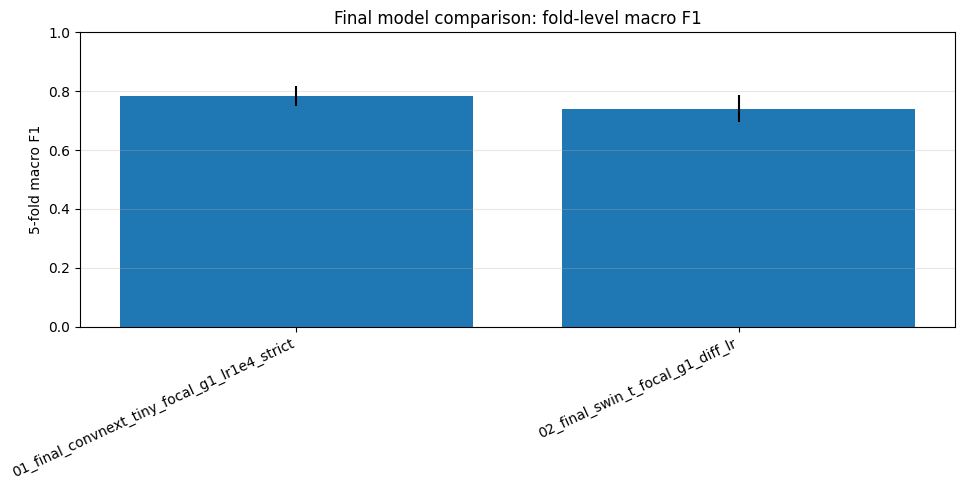

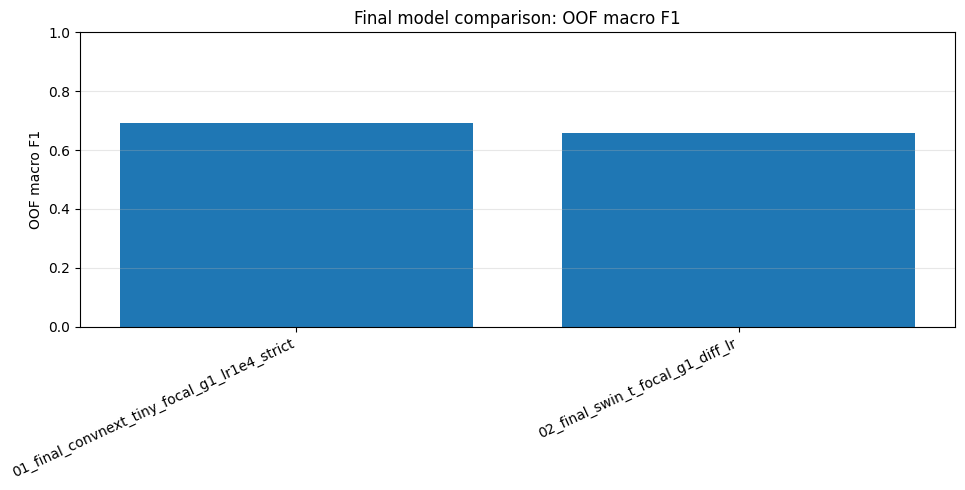

display_label,left_inferior_turbinate_abnormal,left_maxillary_abnormal,nasal_septum_abnormal,right_inferior_turbinate_abnormal,right_maxillary_abnormal
experiment,,,,,
01_final_convnext_tiny_focal_g1_lr1e4_strict,0.710744,0.583333,0.735484,0.768000,0.666667
02_final_swin_t_focal_g1_diff_lr,0.662420,0.588235,0.736264,0.701987,0.593750


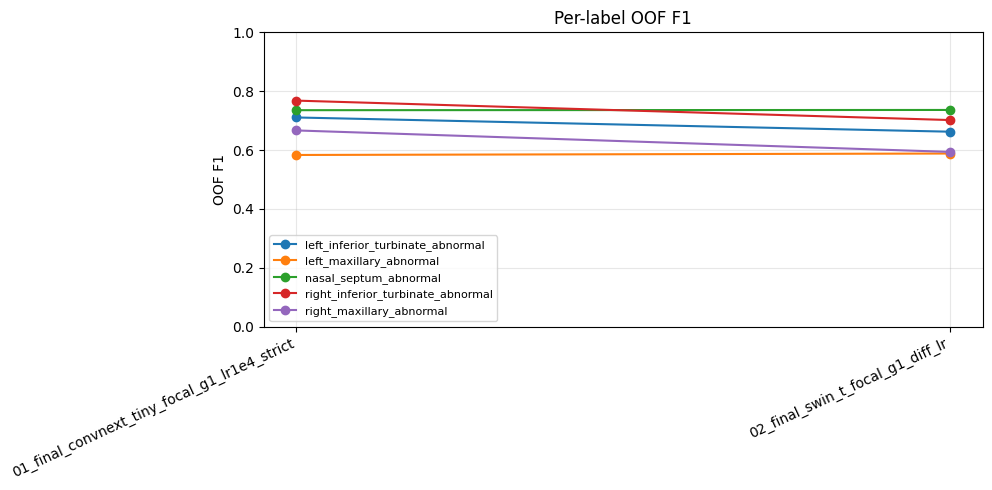

Found history files: 10


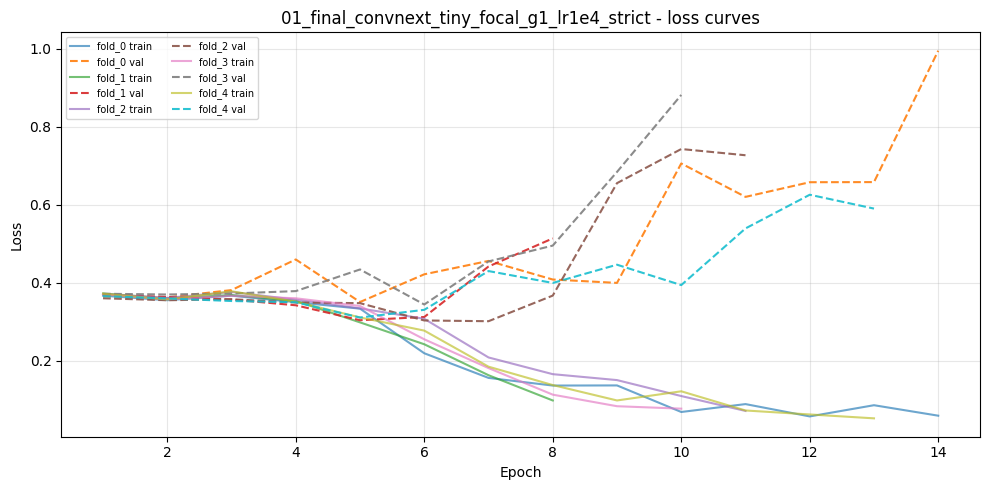

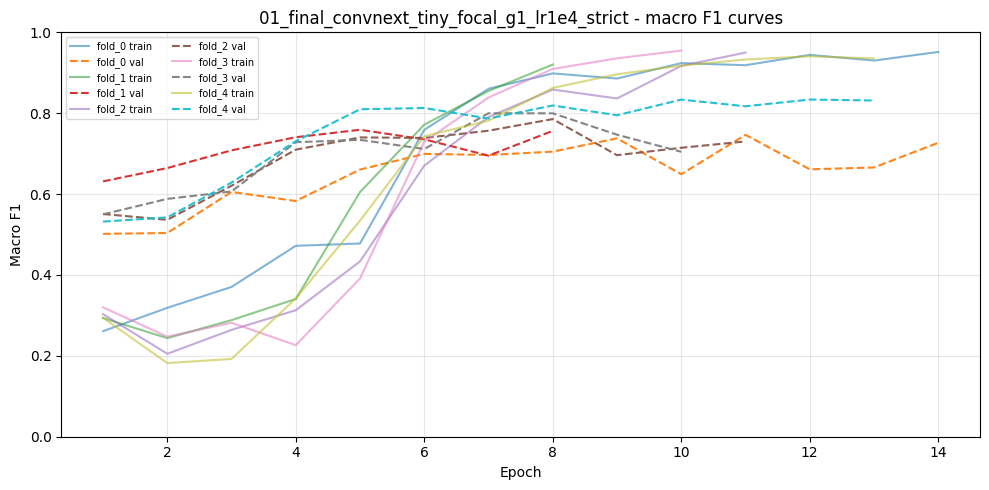

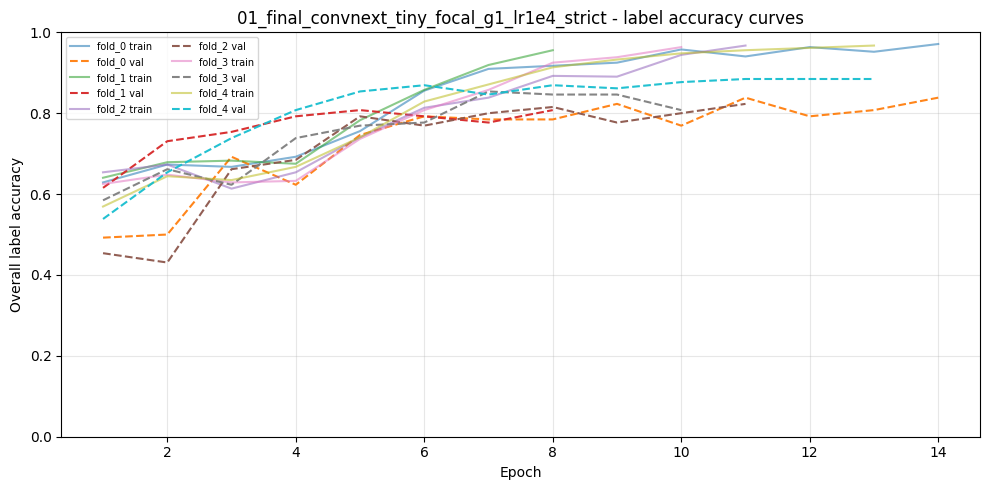

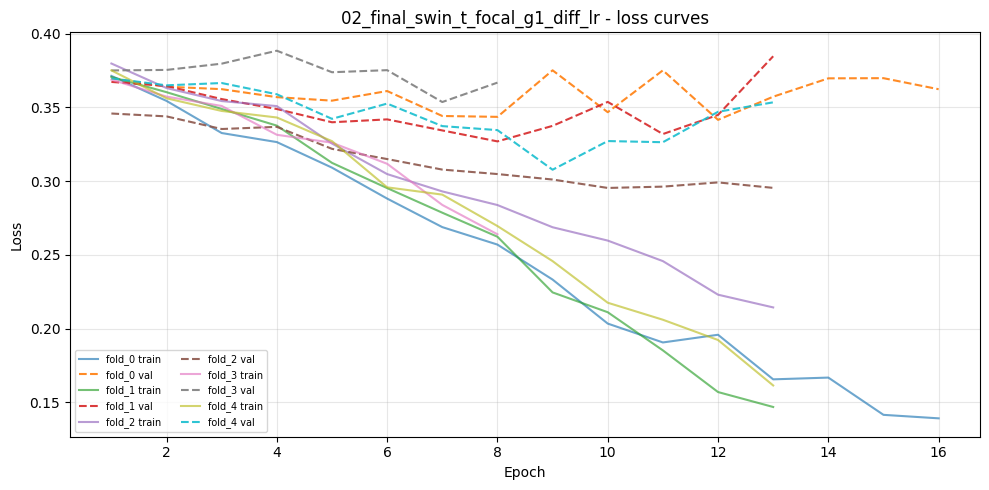

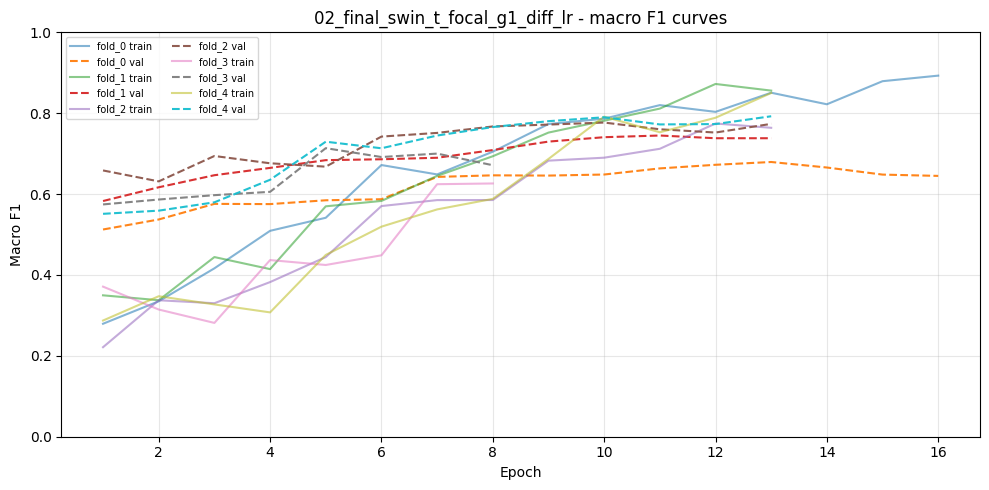

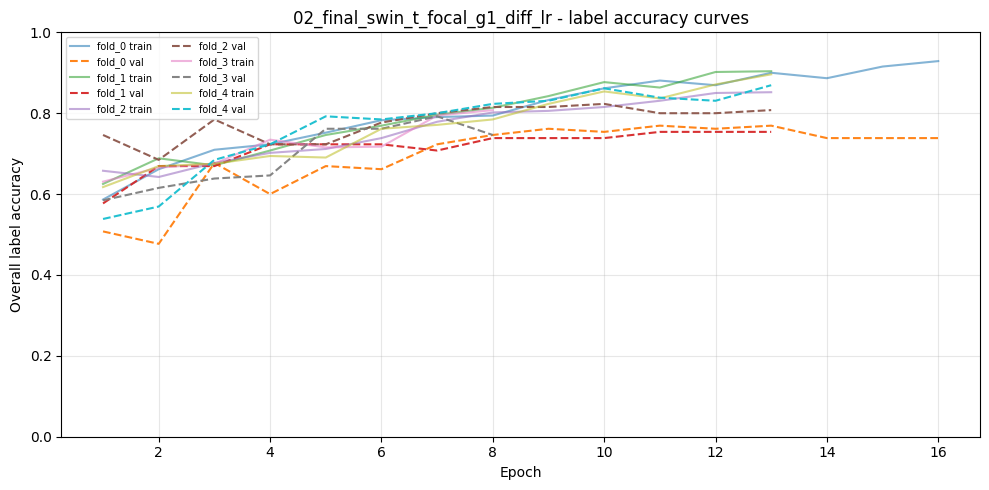

01_final_convnext_tiny_focal_g1_lr1e4_strict: 5x5 positive-label matrix uses 107 abnormal cases; skipped 23 all-negative cases. Only five abnormality labels are plotted.


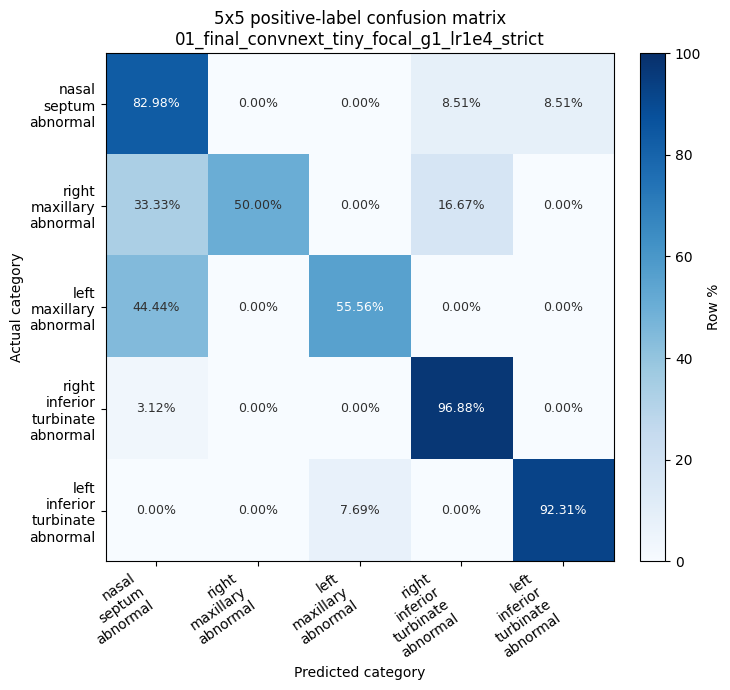

02_final_swin_t_focal_g1_diff_lr: 5x5 positive-label matrix uses 107 abnormal cases; skipped 23 all-negative cases. Only five abnormality labels are plotted.


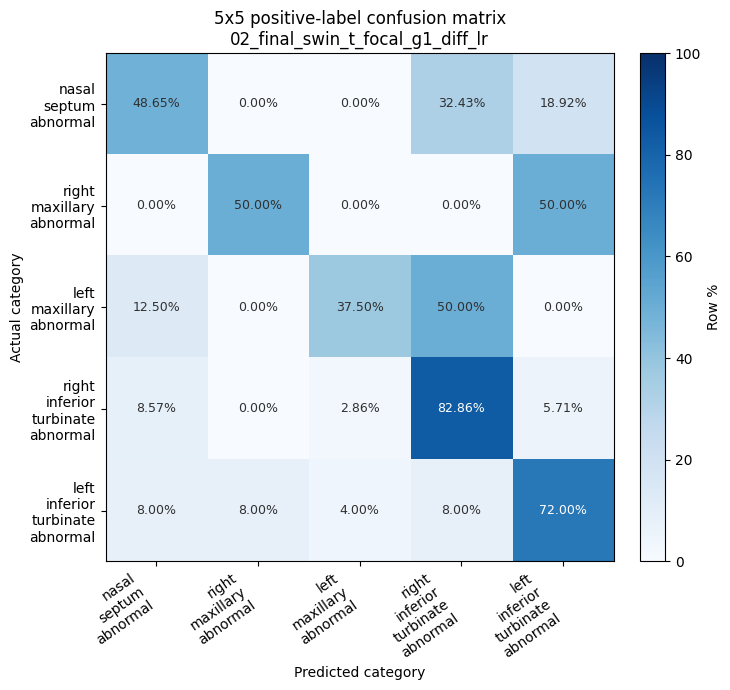

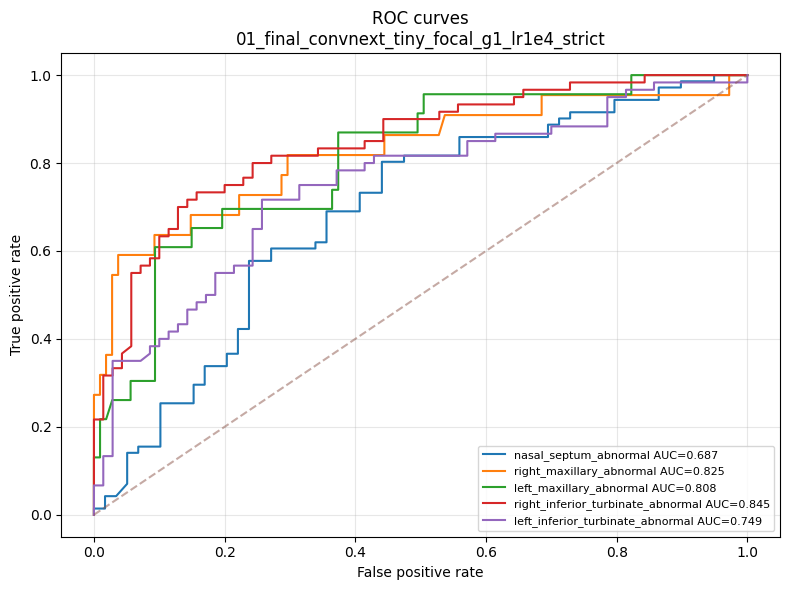

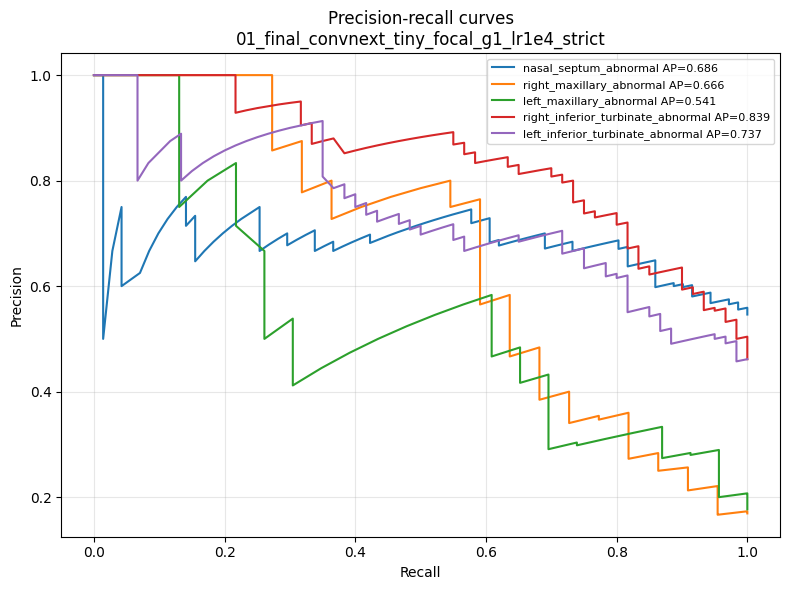

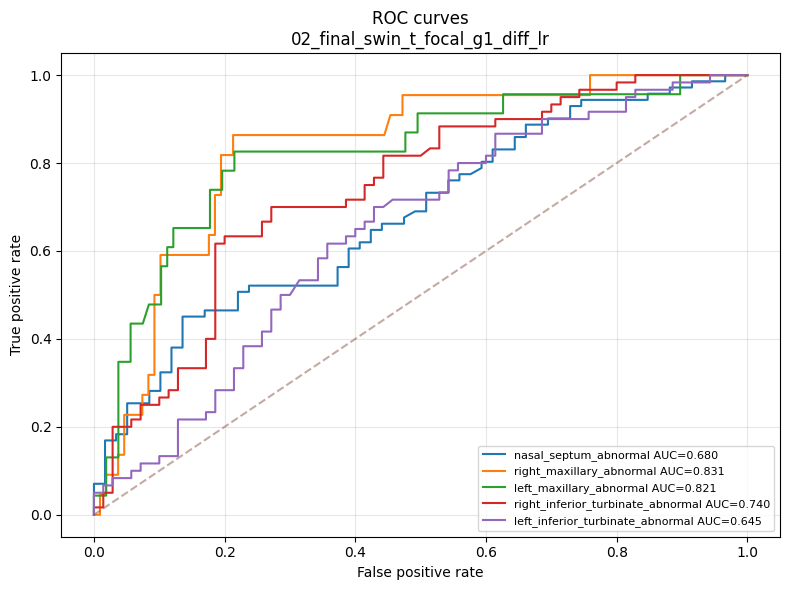

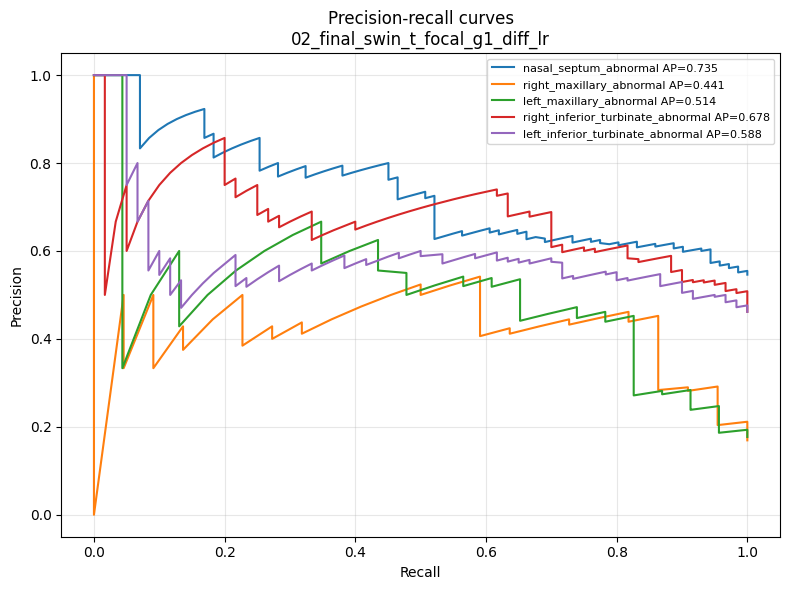

Plots saved in: /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/plots


In [22]:
plots_dir = os.path.join(CFG["output_dir"], "plots")
Path(plots_dir).mkdir(parents=True, exist_ok=True)

def safe_name(x):
    return re.sub(r"[^A-Za-z0-9_.-]+", "_", str(x))[:160]

def save_show(path):
    plt.tight_layout()
    plt.savefig(path, dpi=190, bbox_inches="tight")
    plt.show()

def plot_row_normalized_matrix_percent_only(mat_counts, labels, title, path):
    counts = np.asarray(mat_counts, dtype=float)
    row_sums = counts.sum(axis=1, keepdims=True)
    pct = np.divide(counts, np.maximum(row_sums, 1), out=np.zeros_like(counts), where=row_sums > 0) * 100.0
    fig, ax = plt.subplots(figsize=(8, 7))
    im = ax.imshow(pct, vmin=0, vmax=100, cmap="Blues", interpolation="nearest")
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, rotation=35, ha="right")
    ax.set_yticklabels(labels)
    ax.set_xlabel("Predicted category")
    ax.set_ylabel("Actual category")
    ax.set_title(title)
    for i in range(pct.shape[0]):
        for j in range(pct.shape[1]):
            color = "white" if pct[i, j] >= 55 else "#303030"
            ax.text(j, i, f"{pct[i, j]:.2f}%", ha="center", va="center", fontsize=9, color=color)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Row %")
    save_show(path)

def dominant_positive_5x5_matrix(df):
    # 5x5 only. Cases with no positive true abnormality are omitted; only the five abnormality labels are plotted.
    y_true = df[[f"true_{l}" for l in TARGET_COLS]].values.astype(int)
    y_pred = df[[f"pred_{l}" for l in TARGET_COLS]].values.astype(int)
    y_prob = df[[f"prob_{l}" for l in TARGET_COLS]].values.astype(float)
    cm = np.zeros((len(TARGET_COLS), len(TARGET_COLS)), dtype=int)
    used = skipped = 0
    for i in range(y_true.shape[0]):
        true_idx = np.where(y_true[i] == 1)[0]
        if len(true_idx) == 0:
            skipped += 1
            continue
        true_dom = true_idx[np.argmax(y_prob[i, true_idx])]
        pred_idx = np.where(y_pred[i] == 1)[0]
        pred_dom = int(np.argmax(y_prob[i])) if len(pred_idx) == 0 else pred_idx[np.argmax(y_prob[i, pred_idx])]
        cm[true_dom, pred_dom] += 1
        used += 1
    return cm, used, skipped

# Comparison bars
plt.figure(figsize=(10, 5))
plt.bar(fold_comparison["experiment"], fold_comparison["macro_f1_mean"], yerr=fold_comparison["macro_f1_std"].fillna(0))
plt.xticks(rotation=25, ha="right")
plt.ylim(0, 1)
plt.ylabel("5-fold macro F1")
plt.title("Final model comparison: fold-level macro F1")
plt.grid(True, axis="y", alpha=0.3)
save_show(os.path.join(plots_dir, "final_fold_macro_f1_comparison.png"))

plt.figure(figsize=(10, 5))
plt.bar(oof_primary["experiment"], oof_primary["macro_f1"])
plt.xticks(rotation=25, ha="right")
plt.ylim(0, 1)
plt.ylabel("OOF macro F1")
plt.title("Final model comparison: OOF macro F1")
plt.grid(True, axis="y", alpha=0.3)
save_show(os.path.join(plots_dir, "final_oof_macro_f1_comparison.png"))

pivot = primary_per_label.pivot(index="experiment", columns="display_label", values="f1")
display(pivot)
plt.figure(figsize=(10, 5))
for col in pivot.columns:
    plt.plot(pivot.index, pivot[col], marker="o", label=col)
plt.xticks(rotation=25, ha="right")
plt.ylim(0, 1)
plt.ylabel("OOF F1")
plt.title("Per-label OOF F1")
plt.legend(fontsize=8)
plt.grid(True, alpha=0.3)
save_show(os.path.join(plots_dir, "final_per_label_oof_f1.png"))

# Learning curves
history_files = sorted(glob.glob(os.path.join(CFG["output_dir"], "*", "fold_*", "history.csv")))
print("Found history files:", len(history_files))
if history_files:
    history_df = pd.concat([pd.read_csv(p).assign(experiment=Path(p).parents[1].name, fold=Path(p).parents[0].name) for p in history_files], ignore_index=True)
    history_df.to_csv(os.path.join(CFG["output_dir"], "training_history_all_experiments.csv"), index=False)
    for exp_name, exp_df in history_df.groupby("experiment"):
        outdir = os.path.join(plots_dir, "learning_curves", safe_name(exp_name)); Path(outdir).mkdir(parents=True, exist_ok=True)
        plt.figure(figsize=(10, 5))
        for fold_name, fold_df in exp_df.groupby("fold"):
            plt.plot(fold_df["epoch"], fold_df["train_loss"], alpha=.65, label=f"{fold_name} train")
            plt.plot(fold_df["epoch"], fold_df["val_loss"], '--', alpha=.9, label=f"{fold_name} val")
        plt.title(f"{exp_name} - loss curves"); plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.grid(True, alpha=.3); plt.legend(fontsize=7, ncol=2)
        save_show(os.path.join(outdir, f"{safe_name(exp_name)}_loss_curves.png"))
        plt.figure(figsize=(10, 5))
        for fold_name, fold_df in exp_df.groupby("fold"):
            if "train_macro_f1" in fold_df: plt.plot(fold_df["epoch"], fold_df["train_macro_f1"], alpha=.55, label=f"{fold_name} train")
            if "val_f1_macro_f1" in fold_df: plt.plot(fold_df["epoch"], fold_df["val_f1_macro_f1"], '--', alpha=.95, label=f"{fold_name} val")
        plt.title(f"{exp_name} - macro F1 curves"); plt.xlabel("Epoch"); plt.ylabel("Macro F1"); plt.ylim(0,1); plt.grid(True, alpha=.3); plt.legend(fontsize=7, ncol=2)
        save_show(os.path.join(outdir, f"{safe_name(exp_name)}_macro_f1_curves.png"))
        plt.figure(figsize=(10, 5))
        for fold_name, fold_df in exp_df.groupby("fold"):
            if "train_overall_label_accuracy" in fold_df: plt.plot(fold_df["epoch"], fold_df["train_overall_label_accuracy"], alpha=.55, label=f"{fold_name} train")
            if "val_f1_overall_label_accuracy" in fold_df: plt.plot(fold_df["epoch"], fold_df["val_f1_overall_label_accuracy"], '--', alpha=.95, label=f"{fold_name} val")
        plt.title(f"{exp_name} - label accuracy curves"); plt.xlabel("Epoch"); plt.ylabel("Overall label accuracy"); plt.ylim(0,1); plt.grid(True, alpha=.3); plt.legend(fontsize=7, ncol=2)
        save_show(os.path.join(outdir, f"{safe_name(exp_name)}_accuracy_curves.png"))

# 5x5 confusion matrices ONLY
labels_pretty = [display_label_multiline(l) for l in TARGET_COLS]
for exp_name, exp_df in oof_pred_df.groupby("experiment"):
    cm5, used, skipped = dominant_positive_5x5_matrix(exp_df)
    print(f"{exp_name}: 5x5 positive-label matrix uses {used} abnormal cases; skipped {skipped} all-negative cases. Only five abnormality labels are plotted.")
    plot_row_normalized_matrix_percent_only(cm5, labels_pretty, f"5x5 positive-label confusion matrix\n{exp_name}", os.path.join(plots_dir, f"{safe_name(exp_name)}_5x5_positive_label_confusion_matrix.png"))

# ROC/PR curves
for exp_name, exp_df in oof_pred_df.groupby("experiment"):
    outdir = os.path.join(plots_dir, "roc_pr", safe_name(exp_name)); Path(outdir).mkdir(parents=True, exist_ok=True)
    y_true = exp_df[[f"true_{l}" for l in TARGET_COLS]].values.astype(int)
    y_prob = exp_df[[f"prob_{l}" for l in TARGET_COLS]].values.astype(float)
    plt.figure(figsize=(8, 6))
    for i, label in enumerate(TARGET_COLS):
        if len(np.unique(y_true[:, i])) < 2: continue
        fpr, tpr, _ = roc_curve(y_true[:, i], y_prob[:, i]); auc_val = safe_auc(y_true[:, i], y_prob[:, i])
        plt.plot(fpr, tpr, label=f"{display_label(label)} AUC={auc_val:.3f}")
    plt.plot([0,1],[0,1], '--', alpha=.5); plt.xlabel("False positive rate"); plt.ylabel("True positive rate"); plt.title(f"ROC curves\n{exp_name}"); plt.legend(fontsize=8); plt.grid(True, alpha=.3)
    save_show(os.path.join(outdir, f"{safe_name(exp_name)}_roc_curves.png"))
    plt.figure(figsize=(8, 6))
    for i, label in enumerate(TARGET_COLS):
        precision, recall, _ = precision_recall_curve(y_true[:, i], y_prob[:, i]); ap_val = safe_ap(y_true[:, i], y_prob[:, i])
        plt.plot(recall, precision, label=f"{display_label(label)} AP={ap_val:.3f}")
    plt.xlabel("Recall"); plt.ylabel("Precision"); plt.title(f"Precision-recall curves\n{exp_name}"); plt.legend(fontsize=8); plt.grid(True, alpha=.3)
    save_show(os.path.join(outdir, f"{safe_name(exp_name)}_pr_curves.png"))

print("Plots saved in:", plots_dir)


## 23. Final artifact list

In [23]:
artifacts = {
    "output_dir": CFG["output_dir"],
    "roi_cache_dir": CFG["roi_cache_dir"],
    "fold_split_json": os.path.join(CFG["output_dir"], "five_fold_split.json"),
    "fold_label_distribution_csv": os.path.join(CFG["output_dir"], "fold_label_distribution.csv"),
    "fold_summary_all_experiments_csv": os.path.join(CFG["output_dir"], "fold_summary_all_experiments.csv"),
    "experiment_comparison_5fold_csv": os.path.join(CFG["output_dir"], "experiment_comparison_5fold.csv"),
    "oof_predictions_all_experiments_csv": os.path.join(CFG["output_dir"], "oof_predictions_all_experiments.csv"),
    "oof_thresholds_all_experiments_csv": os.path.join(CFG["output_dir"], "oof_thresholds_all_experiments.csv"),
    "oof_threshold_metrics_all_experiments_csv": os.path.join(CFG["output_dir"], "oof_threshold_metrics_all_experiments.csv"),
    "per_label_metrics_all_experiments_csv": os.path.join(CFG["output_dir"], "per_label_metrics_all_experiments.csv"),
    "oof_per_label_metrics_all_experiments_csv": os.path.join(CFG["output_dir"], "oof_per_label_metrics_all_experiments.csv"),
    "training_history_all_experiments_csv": os.path.join(CFG["output_dir"], "training_history_all_experiments.csv"),
    "plots_dir": os.path.join(CFG["output_dir"], "plots"),
}
with open(os.path.join(CFG["output_dir"], "final_artifacts.json"), "w") as f:
    json.dump(artifacts, f, indent=2)
print("Final artifacts:")
for k, v in artifacts.items():
    print(f"{k:50s}: {v} | exists={os.path.exists(v)}")


Final artifacts:
output_dir                                        : /kaggle/working/nasal_ct_real_final_convnext_swin_5fold | exists=True
roi_cache_dir                                     : /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/roi_cache | exists=True
fold_split_json                                   : /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/five_fold_split.json | exists=True
fold_label_distribution_csv                       : /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/fold_label_distribution.csv | exists=True
fold_summary_all_experiments_csv                  : /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/fold_summary_all_experiments.csv | exists=True
experiment_comparison_5fold_csv                   : /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/experiment_comparison_5fold.csv | exists=True
oof_predictions_all_experiments_csv               : /kaggle/working/nasal_ct_real_final_convnext_swin_5fold/oof_predictions_all